[WeatherBench 2](https://weatherbench2.readthedocs.io/en/latest/)

**WeatherBench 2** is a framework for evaluating and comparing data-driven and traditional numerical weather forecasting models.

# **I-GOOGLE ACCOUNT AUTHENTIFICATION**

In [ ]:
from google.colab import auth
auth.authenticate_user()


# **II-IMPORT THE REQUIREMENTS LIBRARIES**

In [ ]:
# !pip install cupy
# import cupy as cp

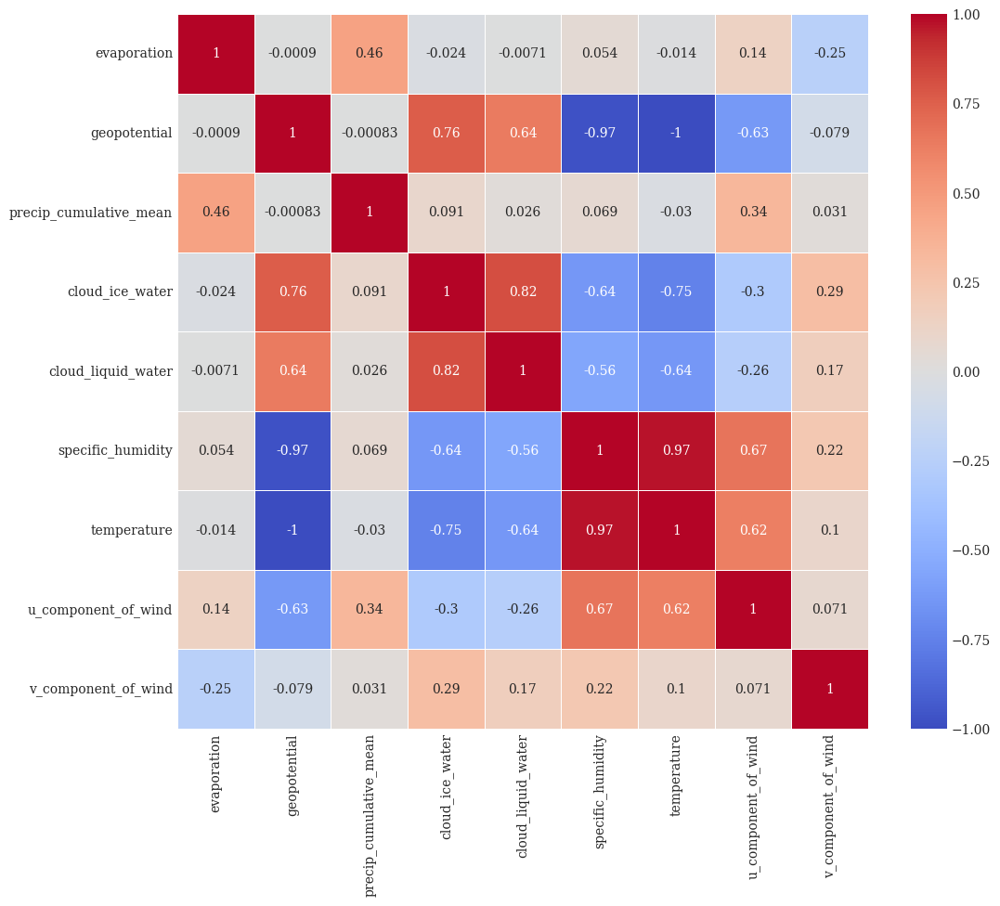

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Data defined manually (Lat/Lon removed)
# These values correspond to the intersections in your second image
data = {
    'evaporation':            [ 1.0,    -0.0009, 0.46,   -0.024, -0.0071, 0.054, -0.014,  0.14,  -0.25],
    'geopotential':           [-0.0009,  1.0,   -0.00083, 0.76,   0.64,  -0.97,  -1.0,   -0.63,  -0.079],
    'precip_cumulative_mean': [ 0.46,   -0.00083, 1.0,    0.091,  0.026,  0.069, -0.03,   0.34,   0.031],
    'cloud_ice_water':        [-0.024,   0.76,    0.091,  1.0,    0.82,  -0.64,  -0.75,  -0.30,   0.29],
    'cloud_liquid_water':     [-0.0071,  0.64,    0.026,  0.82,   1.0,   -0.56,  -0.64,  -0.26,   0.17],
    'specific_humidity':      [ 0.054,  -0.97,    0.069, -0.64,  -0.56,   1.0,    0.97,   0.67,   0.22],
    'temperature':            [-0.014,  -1.0,    -0.03,  -0.75,  -0.64,   0.97,   1.0,    0.62,   0.10],
    'u_component_of_wind':    [ 0.14,   -0.63,    0.34,  -0.30,  -0.26,   0.67,   0.62,   1.0,    0.071],
    'v_component_of_wind':    [-0.25,   -0.079,   0.031,  0.29,   0.17,   0.22,   0.10,   0.071,  1.0]
}

labels = [
    'evaporation',
    'geopotential',
    'precip_cumulative_mean',
    'cloud_ice_water',
    'cloud_liquid_water',
    'specific_humidity',
    'temperature',
    'u_component_of_wind',
    'v_component_of_wind'
]

# Create DataFrame
corr_matrix = pd.DataFrame(data, index=labels)

# 2. Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2g", linewidths=0.5, vmin=-1, vmax=1)

# 3. Save as PDF
plt.savefig("Correlation_Matrix.pdf", format='pdf', bbox_inches='tight')

# Show plot
plt.show()

In [ ]:
! pip install -q -U zarr xarray gcsfs
import xarray as xr
import gcsfs
import zarr
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd



In [ ]:

# define the neuralgcm path data
ngcm_path = 'gs://neuralgcm/amip_runs/v1_precip_stochastic_2_8_deg/2001-to-2021_128x64_gauss_37-level_stride3h.zarr'
#load the data
# ngcm_data = xr.open_zarr(ngcm_path,chunks={"time":100})
ngcm_data = xr.open_zarr(ngcm_path)

<ipython-input-27-cd22bc7a61c8>:5: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ngcm_data = xr.open_zarr(ngcm_path)


In [ ]:
#the size of the neural gcm data
ngcm_data.nbytes/1e9

1628.740724872

In [ ]:
print(list(ngcm_data.data_vars))

['evaporation', 'geopotential', 'precipitation_cumulative_mean', 'specific_cloud_ice_water_content', 'specific_cloud_liquid_water_content', 'specific_humidity', 'temperature', 'u_component_of_wind', 'v_component_of_wind']


In [ ]:
# # prompt: je veux savoir la valeur minimal de chaque variable

# for var in list(ngcm_data.data_vars):
#   print(f"Minimum value of {var}: {ngcm_data[var].min().values}")

# **Data Understanding**

In [ ]:
ngcm_data.info()

xarray.Dataset {
dimensions:
	time = 37 ;
	prediction_timedelta = 58408 ;
	surface = 1 ;
	longitude = 128 ;
	latitude = 64 ;
	level = 3 ;

variables:
	float32 evaporation(time, prediction_timedelta, surface, longitude, latitude) ;
	float32 geopotential(time, prediction_timedelta, level, longitude, latitude) ;
	float64 latitude(latitude) ;
	int64 level(level) ;
	float64 longitude(longitude) ;
	float32 precipitation_cumulative_mean(time, prediction_timedelta, surface, longitude, latitude) ;
	timedelta64[ns] prediction_timedelta(prediction_timedelta) ;
	float32 specific_cloud_ice_water_content(time, prediction_timedelta, level, longitude, latitude) ;
	float32 specific_cloud_liquid_water_content(time, prediction_timedelta, level, longitude, latitude) ;
	float32 specific_humidity(time, prediction_timedelta, level, longitude, latitude) ;
	int64 surface(surface) ;
	float32 temperature(time, prediction_timedelta, level, longitude, latitude) ;
	datetime64[ns] time(time) ;
	float32 u_component_o

In [ ]:
ngcm_data.precipitation_cumulative_mean


<xarray.DataArray 'precipitation_cumulative_mean' (time: 37,
                                                   prediction_timedelta: 58408,
                                                   surface: 1, longitude: 128,
                                                   latitude: 64)> Size: 71GB
dask.array<open_dataset-precipitation_cumulative_mean, shape=(37, 58408, 1, 128, 64), dtype=float32, chunksize=(1, 8, 1, 128, 64), chunktype=numpy.ndarray>
Coordinates:
  * latitude              (latitude) float64 512B -87.86 -85.1 ... 85.1 87.86
  * longitude             (longitude) float64 1kB 0.0 2.812 ... 354.4 357.2
  * prediction_timedelta  (prediction_timedelta) timedelta64[ns] 467kB 00:00:...
  * surface               (surface) int64 8B 1
  * time                  (time) datetime64[ns] 296B 2001-01-01 ... 2001-12-27

##❗ **Questions:**



*   I had a question about what the base date is for adding the prediction_timedelta, and to resolve it, by checking the number of values in prediction_timedelta and the values it contains, I concluded that the base time is the minimum of the time coordinate.



In [ ]:
#the min and the max values of time in the global neural GCM
print(f"the min date is :",ngcm_data.time.min().values)
print(f"the max date is :",ngcm_data.time.max().values)

the min date is : 2001-01-01T00:00:00.000000000
the max date is : 2001-12-27T00:00:00.000000000


In [ ]:
#the prediction time
ngcm_data.prediction_timedelta.indexes

Indexes:
    prediction_timedelta  TimedeltaIndex([   '0 days 00:00:00',    '0 days 03:00:00',
                   '0 days 06:00:00',    '0 days 09:00:00',
                   '0 days 12:00:00',    '0 days 15:00:00',
                   '0 days 18:00:00',    '0 days 21:00:00',
                   '1 days 00:00:00',    '1 days 03:00:00',
                ...
                '7299 days 18:00:00', '7299 days 21:00:00',
                '7300 days 00:00:00', '7300 days 03:00:00',
                '7300 days 06:00:00', '7300 days 09:00:00',
                '7300 days 12:00:00', '7300 days 15:00:00',
                '7300 days 18:00:00', '7300 days 21:00:00'],
               dtype='timedelta64[ns]', name='prediction_timedelta', length=58408, freq=None)

In [ ]:
#Calculate the exact range of days covered by NeuralGCM.
import pandas as pd

base_date = pd.Timestamp(ngcm_data.time.min().values)
offset = pd.Timedelta(days=7300, hours=21)
final_date = base_date + offset

print(final_date)


2020-12-27 21:00:00


In [ ]:
#Calculate the exact range of days covered by NeuralGCM.
import pandas as pd

base_date = pd.Timestamp(ngcm_data.time.max().values)
offset = pd.Timedelta(days=7300, hours=21)
final_date = base_date + offset

print(final_date)


2021-12-22 21:00:00



### 📊 **Dataset Variable Descriptions**


[source](https://github.com/neuralgcm/neuralgcm/blob/main/docs/data_preparation.ipynb)

NeuralGCM models take and produce data on defined on ERA5's 37 pressure levels, including the following variables, provided in SI units and on the NeuralGCM model's native grid:

    Inputs/outputs (on pressure levels): u_component_of_wind, v_component_of_wind, geopotential, temperature, specific_humidity, specific_cloud_ice_water_content, specific_cloud_liquid_water_content.
    Forcings (surface level only): sea_surface_temperature, sea_ice_cover

This dataset contains atmospheric and surface-level variables structured along multiple dimensions. Below is an explanation of each variable:

---

#### 📅 **Temporal Dimensions**

* **`time(time)`** *(datetime64\[ns])*:
  Represents the base timestamps of the forecasts. Each entry corresponds to a specific initialization time.

* **`prediction_timedelta(prediction_timedelta)`** *(timedelta64\[ns])*:
  Specifies the lead times (time offsets) from the base `time`.

---

#### 🌍 **Spatial Dimensions**

* **`longitude(longitude)`** *(float64)*:
  Array of longitudes in degrees (typically 0° to 360° or -180° to 180° depending on the convention used).

* **`latitude(latitude)`** *(float64)*:
  Array of latitudes in degrees (typically from -90° to 90°).

* **`level(level)`** *(int64)*:
  Pressure levels in hPa for variables defined in the atmosphere . This dimension is used for 3D atmospheric fields.

* **`surface(surface)`** *(int64)*:
  A scalar or categorical indicator to mark variables defined at the Earth's surface.

---

#### 🌦️ **Forecast Variables**

* **`evaporation(time, prediction_timedelta, surface, longitude, latitude)`** *(float32)*:
  Total evaporation at the surface (kg/m² or mm equivalent), forecasted over time.

* **`geopotential(time, prediction_timedelta, level, longitude, latitude)`** *(float32)*:
  Geopotential height at various pressure levels (m²/s²), often used to represent height contours in meteorology.

* **`precipitation_cumulative_mean(time, prediction_timedelta, surface, longitude, latitude)`** *(float32)*:
  Cumulative mean precipitation (total rainfall) at the surface.

* **`specific_cloud_ice_water_content(time, prediction_timedelta, level, longitude, latitude)`** *(float32)*:
  The concentration of ice water in clouds at different atmospheric levels.

* **`specific_cloud_liquid_water_content(time, prediction_timedelta, level, longitude, latitude)`** *(float32)*:
  The concentration of liquid water in clouds at different atmospheric levels.

* **`specific_humidity(time, prediction_timedelta, level, longitude, latitude)`** *(float32)*:
  The amount of water vapor per unit mass of air at given pressure levels.

* **`temperature(time, prediction_timedelta, level, longitude, latitude)`** *(float32)*:
  Air temperature at various atmospheric pressure levels (in Kelvin).

* **`u_component_of_wind(time, prediction_timedelta, level, longitude, latitude)`** *(float32)*:
  Zonal (east-west) component of the wind at different levels.

* **`v_component_of_wind(time, prediction_timedelta, level, longitude, latitude)`** *(float32)*:
  Meridional (north-south) component of the wind at different levels.

---
### ⚡**Analysis**

* we can conclude that the data of neural gcm is between **2001-01-01 00:00:00** and **2020-12-27 21:00:00**


| Variable Name                               | SI Unit             | Description                                                                                                                |
| ------------------------------------------- | ------------------- | -------------------------------------------------------------------------------------------------------------------------- |
| **evaporation**                             | **kg/m²** *(or mm)* | Total amount of water evaporated per unit area. In meteorology, **1 kg/m² = 1 mm** of water.                               |
| **geopotential**                            | **m²/s²**           | Gravitational potential energy per unit mass. Often divided by **g = 9.81 m/s²** to get **geopotential height in meters**. |
| **precipitation\_cumulative\_mean**         | **kg/m²** *(or mm)* | Cumulative mean surface precipitation. As with evaporation, **1 kg/m² = 1 mm** of rainfall.                                |
| **specific\_cloud\_ice\_water\_content**    | **kg/kg**           | Mass of ice water in clouds per unit mass of moist air.                                                                    |
| **specific\_cloud\_liquid\_water\_content** | **kg/kg**           | Mass of liquid water in clouds per unit mass of moist air.                                                                 |
| **specific\_humidity**                      | **kg/kg**           | Mass of water vapor per unit mass of moist air (dimensionless but expressed in kg/kg).                                     |
| **temperature**                             | **K** *(Kelvin)*    | Air temperature at different pressure levels.                                                                              |
| **u\_component\_of\_wind**                  | **m/s**             | Zonal (east-west) wind speed. Positive = eastward.                                                                         |
| **v\_component\_of\_wind**                  | **m/s**             | Meridional (north-south) wind speed. Positive = northward.                                                                 |


# **neuralGCM data for our domain**

In [ ]:
#select Horn Africa data
ngcm_data_africa = ngcm_data.sel(latitude=slice(-20,30),longitude=slice(15,60))


In [ ]:
ngcm_data_africa

<xarray.Dataset> Size: 57GB
Dimensions:                              (time: 37,
                                          prediction_timedelta: 58408,
                                          surface: 1, longitude: 16,
                                          latitude: 18, level: 3)
Coordinates:
  * latitude                             (latitude) float64 144B -18.14 ... 29.3
  * level                                (level) int64 24B 500 700 850
  * longitude                            (longitude) float64 128B 16.88 ... 5...
  * prediction_timedelta                 (prediction_timedelta) timedelta64[ns] 467kB ...
  * surface                              (surface) int64 8B 1
  * time                                 (time) datetime64[ns] 296B 2001-01-0...
Data variables:
    evaporation                          (time, prediction_timedelta, surface, longitude, latitude) float32 2GB dask.array<chunksize=(1, 8, 1, 16, 18), meta=np.ndarray>
    geopotential                         (time, prediction_timedelta, level, longitude, latitude) float32 7GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    precipitation_cumulative_mean        (time, prediction_timedelta, surface, longitude, latitude) float32 2GB dask.array<chunksize=(1, 8, 1, 16, 18), meta=np.ndarray>
    specific_cloud_ice_water_content     (time, prediction_timedelta, level, longitude, latitude) float32 7GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    specific_cloud_liquid_water_content  (time, prediction_timedelta, level, longitude, latitude) float32 7GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    specific_humidity                    (time, prediction_timedelta, level, longitude, latitude) float32 7GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    temperature                          (time, prediction_timedelta, level, longitude, latitude) float32 7GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    u_component_of_wind                  (time, prediction_timedelta, level, longitude, latitude) float32 7GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    v_component_of_wind                  (time, prediction_timedelta, level, longitude, latitude) float32 7GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
Attributes:
    experiment_id:  121052169
    worker_id:      2

In [ ]:
!pip install cartopy

Longitude shape: (16,)
Latitude shape: (18,)
Data shape: (16, 18)


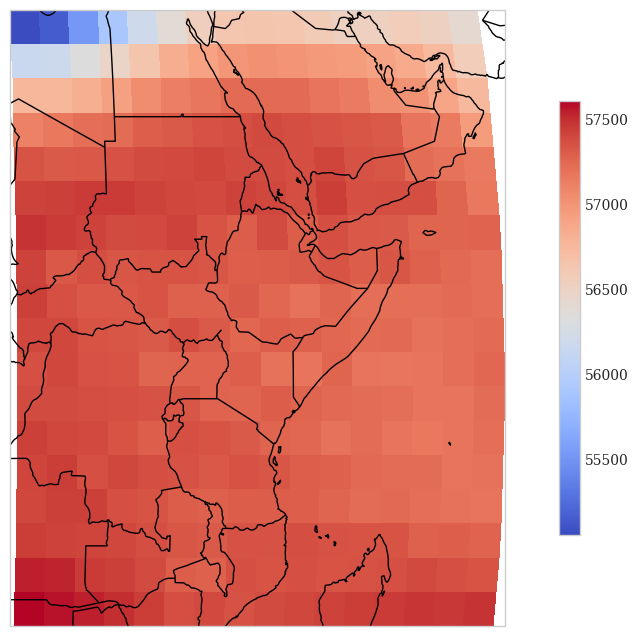

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

fig = plt.figure(figsize=(14,8))
ax = plt.axes(projection=ccrs.Robinson())

lons = ngcm_data_africa.longitude.values
lats = ngcm_data_africa.latitude.values
print(f"Longitude shape: {lons.shape}")
print(f"Latitude shape: {lats.shape}")

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=1)
# Compute the mean along the 'prediction_timedelta' dimension
geopotential_mean = ngcm_data_africa.geopotential.isel({'time':0,'level':0,'prediction_timedelta':ngcm_data_africa.prediction_timedelta[0]}).values
print(f"Data shape: {geopotential_mean.shape}")
c = plt.pcolormesh(lons, lats, geopotential_mean.T, transform=ccrs.PlateCarree(), cmap='coolwarm',shading='nearest')

cb = plt.colorbar(c, fraction=0.02)


In [ ]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import io
from google.cloud import storage
from typing import Dict, Any, Union

# --- 1. GCS and Plot Parameters ---
GCS_BUCKET_NAME = "melvin_aims_bucket"
GCS_BLOB_NAME = "geopotential_horn_africa_map.pdf"

# --- 2. User Data Selection (Reference/Placeholder) ---
# NOTE: This block assumes 'ngcm_data' is a loaded xarray Dataset/DataArray.
# You must execute your selection logic before calling the function.
#
# ngcm_data_africa = ngcm_data.sel(latitude=slice(-20, 30), longitude=slice(15, 60))
# Your area of interest: Lats: -20 to 30, Lons: 15 to 60.


# --- 3. Plotting and Uploading Function ---

# We will re-use the synthetic data just for demonstration and testing the plot logic
# Since your actual data is not available to me. In your execution, this class is ignored.
class NGCMDataAfricaPlaceholder:
    def __init__(self, lats_slice, lons_slice):
        self.longitude = np.linspace(lons_slice[0], lons_slice[1], 80)
        self.latitude = np.linspace(lats_slice[0], lats_slice[1], 60)
        lons, lats = np.meshgrid(self.longitude, self.latitude)
        # Raw data is (N_lon, N_lat) to maintain the need for Transpose fix
        self.geopotential_data_raw = (9700 + 300 * np.cos(np.deg2rad(lats.T)) * np.sin(np.deg2rad(lons.T)))

    def isel(self, selections: Dict[str, Union[int, Any]]):
        return self.geopotential_data_raw

# Initialize the placeholder with the user's new extent
ngcm_data_africa_placeholder = NGCMDataAfricaPlaceholder(lats_slice=(-20, 30), lons_slice=(15, 60))


def plot_and_upload_geopotential(data_object, bucket_name: str, blob_name: str, region_extent: list):
    """
    Generates a Cartopy plot, setting the map extent based on the user's region,
    and uploads it directly to GCS.

    Args:
        data_object: The selected xarray/DataFrame (ngcm_data_africa).
        bucket_name: The target GCS bucket name.
        blob_name: The destination file name (blob) in the bucket.
        region_extent: [lon_min, lon_max, lat_min, lat_max] for the map extent.
    """

    # --- Data Extraction ---
    lons = data_object.longitude
    lats = data_object.latitude

    # Access the 2D data array (simulating the user's selection logic)
    # NOTE: Assuming the data access returns a 2D NumPy array.
    geopotential_mean = data_object.isel({'time':0,'level':0,'prediction_timedelta':0})

    # FIX: Transpose the data from (N_lon, N_lat) to (N_lat, N_lon) for pcolormesh
    data_to_plot = geopotential_mean.T

    # --- Plot Setup and Styling ---
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.rcParams['font.family'] = 'serif'

    fig = plt.figure(figsize=(10, 8)) # Smaller figure size for regional plot
    # Use PlateCarree for simple regional plots
    ax = plt.axes(projection=ccrs.PlateCarree())

    # FIX: Define the map extent based on the user's selection
    ax.set_extent(region_extent, crs=ccrs.PlateCarree())

    ax.coastlines(resolution='50m', linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.8, edgecolor='black')
    ax.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.1)

    # Add gridlines and labels
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 9}
    gl.ylabel_style = {'size': 9}

    # --- Plotting the Data ---
    c = ax.pcolormesh(lons, lats, data_to_plot,
                      transform=ccrs.PlateCarree(),
                      cmap='coolwarm',
                      shading='nearest')

    # Colorbar with clear label
    cb = plt.colorbar(c, ax=ax, orientation='vertical', pad=0.02, fraction=0.04)
    cb.set_label(r'Geopotential ($\text{m}^2/\text{s}^2$)', fontsize=10)

    # Title
    plt.title("Geopotential Distribution over Horn of Africa", fontsize=14, pad=15)

    plt.tight_layout()

    # --- 4. Save to In-Memory Buffer (BytesIO) ---
    buffer = io.BytesIO()
    plt.savefig(buffer, format='pdf', bbox_inches="tight", dpi=300)
    plt.close(fig)

    # --- 5. Upload to GCS ---
    try:
        storage_client = storage.Client()
        bucket = storage_client.bucket(bucket_name)
        blob = bucket.blob(blob_name)

        buffer.seek(0)

        content_type = 'application/pdf' if blob_name.endswith('.pdf') else 'image/png'
        blob.upload_from_file(buffer, content_type=content_type)

        print(f"\nSUCCESS: Plot successfully uploaded to GCS:")
        print(f"Bucket: {bucket_name}")
        print(f"Object: {blob_name}")

    except Exception as e:
        print(f"\nERROR: GCS upload failed.")
        print(f"Error Details: {e}")

# --- Execution ---
if __name__ == '__main__':

    # Define the extent based on the user's selection: [lon_min, lon_max, lat_min, lat_max]
    HORN_AFRICA_EXTENT = [15, 60, -20, 30]

    # NOTE: You MUST replace 'ngcm_data_africa_placeholder' with your actual 'ngcm_data_africa'
    # after you execute your data selection line:
    # ngcm_data_africa = ngcm_data.sel(latitude=slice(-20, 30), longitude=slice(15, 60))

    # Example execution using the placeholder object:
    plot_and_upload_geopotential(ngcm_data_africa_placeholder, GCS_BUCKET_NAME, GCS_BLOB_NAME, HORN_AFRICA_EXTENT)

/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)



SUCCESS: Plot successfully uploaded to GCS:
Bucket: melvin_aims_bucket
Object: geopotential_horn_africa_map.pdf


In [ ]:
# Identify precipitation variable name (commonly 'tp' or 'precip')
precip_name = [var for var in ngcm_data_africa.data_vars if 'precip' in var or 'tp' in var][0]
precip = ngcm_data_africa[precip_name]
precip

<xarray.DataArray 'precipitation_cumulative_mean' (time: 37,
                                                   prediction_timedelta: 58408,
                                                   surface: 1, longitude: 16,
                                                   latitude: 18)> Size: 2GB
dask.array<getitem, shape=(37, 58408, 1, 16, 18), dtype=float32, chunksize=(1, 8, 1, 16, 18), chunktype=numpy.ndarray>
Coordinates:
  * latitude              (latitude) float64 144B -18.14 -15.35 ... 26.51 29.3
  * longitude             (longitude) float64 128B 16.88 19.69 ... 56.25 59.06
  * prediction_timedelta  (prediction_timedelta) timedelta64[ns] 467kB 00:00:...
  * surface               (surface) int64 8B 1
  * time                  (time) datetime64[ns] 296B 2001-01-01 ... 2001-12-27

In [ ]:
#the size of the horn africa data in GO
ngcm_data_africa.nbytes/1e9

57.26086748

In [ ]:
#the prediction time
ngcm_data_africa.prediction_timedelta.indexes

Indexes:
    prediction_timedelta  TimedeltaIndex([   '0 days 00:00:00',    '0 days 03:00:00',
                   '0 days 06:00:00',    '0 days 09:00:00',
                   '0 days 12:00:00',    '0 days 15:00:00',
                   '0 days 18:00:00',    '0 days 21:00:00',
                   '1 days 00:00:00',    '1 days 03:00:00',
                ...
                '7299 days 18:00:00', '7299 days 21:00:00',
                '7300 days 00:00:00', '7300 days 03:00:00',
                '7300 days 06:00:00', '7300 days 09:00:00',
                '7300 days 12:00:00', '7300 days 15:00:00',
                '7300 days 18:00:00', '7300 days 21:00:00'],
               dtype='timedelta64[ns]', name='prediction_timedelta', length=58408, freq=None)

# we can now selected the 6h time delta

In [ ]:
#select the climate timeset where prediction_timedelta is a multiple of 6h

# Convert prediction_timedelta to a pandas Series for easier manipulation
prediction_timedelta_series = pd.Series(ngcm_data_africa.prediction_timedelta.values)

# Select values where prediction_timedelta is a multiple of 6 hours (in seconds)
selected_indices = prediction_timedelta_series[prediction_timedelta_series % pd.Timedelta(hours=6) == pd.Timedelta(0)].index

# Use the selected indices to filter the entire dataset
selected_data = ngcm_data_africa.isel(prediction_timedelta=selected_indices)

selected_data

<xarray.Dataset> Size: 29GB
Dimensions:                              (time: 37,
                                          prediction_timedelta: 29204,
                                          surface: 1, longitude: 16,
                                          latitude: 18, level: 3)
Coordinates:
  * latitude                             (latitude) float64 144B -18.14 ... 29.3
  * level                                (level) int64 24B 500 700 850
  * longitude                            (longitude) float64 128B 16.88 ... 5...
  * prediction_timedelta                 (prediction_timedelta) timedelta64[ns] 234kB ...
  * surface                              (surface) int64 8B 1
  * time                                 (time) datetime64[ns] 296B 2001-01-0...
Data variables:
    evaporation                          (time, prediction_timedelta, surface, longitude, latitude) float32 1GB dask.array<chunksize=(1, 8, 1, 16, 18), meta=np.ndarray>
    geopotential                         (time, prediction_timedelta, level, longitude, latitude) float32 4GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    precipitation_cumulative_mean        (time, prediction_timedelta, surface, longitude, latitude) float32 1GB dask.array<chunksize=(1, 8, 1, 16, 18), meta=np.ndarray>
    specific_cloud_ice_water_content     (time, prediction_timedelta, level, longitude, latitude) float32 4GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    specific_cloud_liquid_water_content  (time, prediction_timedelta, level, longitude, latitude) float32 4GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    specific_humidity                    (time, prediction_timedelta, level, longitude, latitude) float32 4GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    temperature                          (time, prediction_timedelta, level, longitude, latitude) float32 4GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    u_component_of_wind                  (time, prediction_timedelta, level, longitude, latitude) float32 4GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    v_component_of_wind                  (time, prediction_timedelta, level, longitude, latitude) float32 4GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
Attributes:
    experiment_id:  121052169
    worker_id:      2

In [ ]:
selected_data.nbytes/1e9

28.63043404

In [ ]:
print(selected_data.info())

xarray.Dataset {
dimensions:
	time = 37 ;
	prediction_timedelta = 29204 ;
	surface = 1 ;
	longitude = 16 ;
	latitude = 18 ;
	level = 3 ;

variables:
	float32 evaporation(time, prediction_timedelta, surface, longitude, latitude) ;
	float32 geopotential(time, prediction_timedelta, level, longitude, latitude) ;
	float64 latitude(latitude) ;
	int64 level(level) ;
	float64 longitude(longitude) ;
	float32 precipitation_cumulative_mean(time, prediction_timedelta, surface, longitude, latitude) ;
	timedelta64[ns] prediction_timedelta(prediction_timedelta) ;
	float32 specific_cloud_ice_water_content(time, prediction_timedelta, level, longitude, latitude) ;
	float32 specific_cloud_liquid_water_content(time, prediction_timedelta, level, longitude, latitude) ;
	float32 specific_humidity(time, prediction_timedelta, level, longitude, latitude) ;
	int64 surface(surface) ;
	float32 temperature(time, prediction_timedelta, level, longitude, latitude) ;
	datetime64[ns] time(time) ;
	float32 u_component_of

In [ ]:
selected_data

<xarray.Dataset> Size: 29GB
Dimensions:                              (time: 37,
                                          prediction_timedelta: 29204,
                                          surface: 1, longitude: 16,
                                          latitude: 18, level: 3)
Coordinates:
  * latitude                             (latitude) float64 144B -18.14 ... 29.3
  * level                                (level) int64 24B 500 700 850
  * longitude                            (longitude) float64 128B 16.88 ... 5...
  * prediction_timedelta                 (prediction_timedelta) timedelta64[ns] 234kB ...
  * surface                              (surface) int64 8B 1
  * time                                 (time) datetime64[ns] 296B 2001-01-0...
Data variables:
    evaporation                          (time, prediction_timedelta, surface, longitude, latitude) float32 1GB dask.array<chunksize=(1, 8, 1, 16, 18), meta=np.ndarray>
    geopotential                         (time, prediction_timedelta, level, longitude, latitude) float32 4GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    precipitation_cumulative_mean        (time, prediction_timedelta, surface, longitude, latitude) float32 1GB dask.array<chunksize=(1, 8, 1, 16, 18), meta=np.ndarray>
    specific_cloud_ice_water_content     (time, prediction_timedelta, level, longitude, latitude) float32 4GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    specific_cloud_liquid_water_content  (time, prediction_timedelta, level, longitude, latitude) float32 4GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    specific_humidity                    (time, prediction_timedelta, level, longitude, latitude) float32 4GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    temperature                          (time, prediction_timedelta, level, longitude, latitude) float32 4GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    u_component_of_wind                  (time, prediction_timedelta, level, longitude, latitude) float32 4GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
    v_component_of_wind                  (time, prediction_timedelta, level, longitude, latitude) float32 4GB dask.array<chunksize=(1, 8, 3, 16, 18), meta=np.ndarray>
Attributes:
    experiment_id:  121052169
    worker_id:      2

--- 1. Extraction des données pour l'année 2018 ---
--- 2. Lecture des niveaux de pression réels ---


100%|██████████| 9/9 [02:50<00:00, 18.93s/it]



📊 CORRÉLATIONS AVEC LA PRÉCIPITATION :
specific_humidity_850hPa                      0.630276
specific_humidity_700hPa                      0.495522
specific_humidity_500hPa                      0.402876
specific_cloud_liquid_water_content_500hPa    0.354697
temperature_500hPa                            0.279482
specific_cloud_liquid_water_content_700hPa    0.248713
specific_cloud_liquid_water_content_850hPa    0.239801
specific_cloud_ice_water_content_500hPa       0.202385
v_component_of_wind_850hPa                    0.162993
geopotential_500hPa                           0.149859
v_component_of_wind_700hPa                    0.138746
geopotential_700hPa                           0.058634
geopotential_850hPa                           0.041903
specific_cloud_ice_water_content_850hPa       0.021469
temperature_700hPa                           -0.041535
v_component_of_wind_500hPa                   -0.043459
temperature_850hPa                           -0.060260
specific_cloud_ice_water_

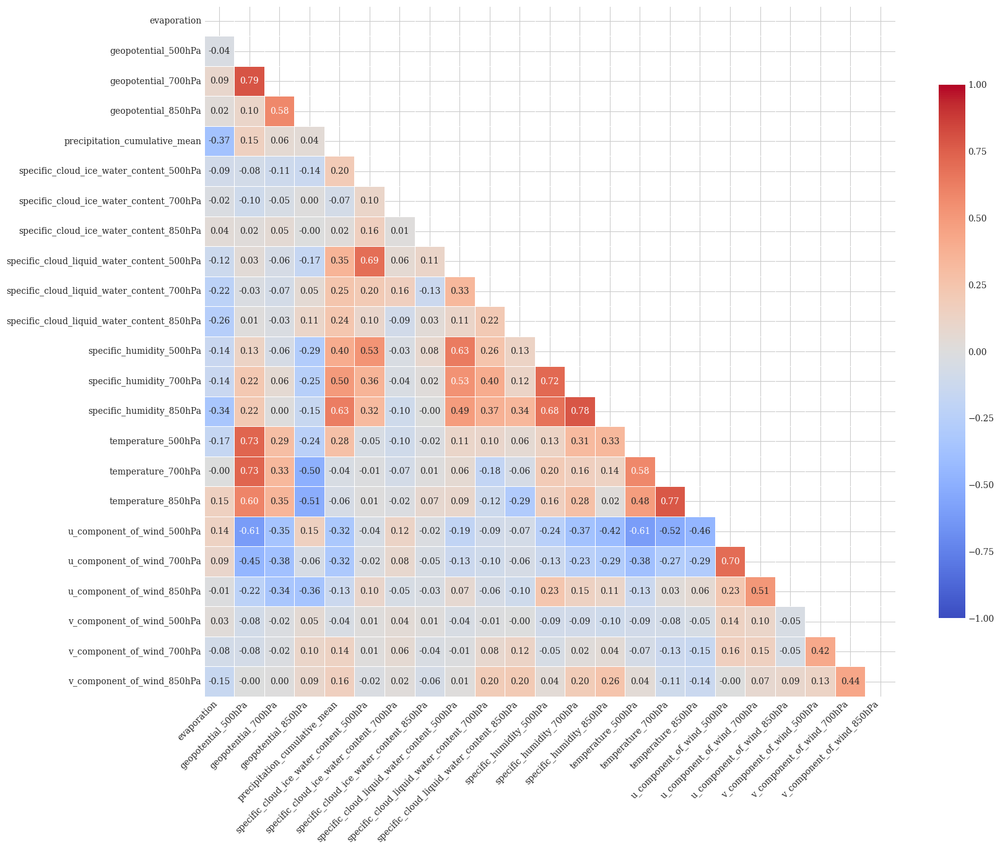

In [ ]:
import xarray as xr
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

# ==============================================================================
# ÉTAPE 1 : PRÉPARATION DES DONNÉES AVEC LES VRAIS NOMS DE PRESSION
# ==============================================================================
def prepare_data_with_real_levels(ds, target_year=2018, subsample_frac=0.05):
    print(f"--- 1. Extraction des données pour l'année {target_year} ---")

    # Calcul des dates réelles
    base_time = ds.time.values[0]
    valid_times = base_time + ds.prediction_timedelta.values
    valid_dates_pd = pd.to_datetime(valid_times)
    mask_year = (valid_dates_pd.year == target_year)

    if np.sum(mask_year) == 0:
        print(f"❌ Aucune donnée trouvée pour {target_year}")
        return None

    # Découpage du dataset
    ds_subset = ds.isel(prediction_timedelta=mask_year).isel(time=0)
    if 'surface' in ds_subset.dims:
        ds_subset = ds_subset.squeeze('surface')

    # Aplatissement et RENOMMAGE
    data_dict = {}
    vars_to_process = [v for v in ds_subset.data_vars]

    print("--- 2. Lecture des niveaux de pression réels ---")
    for var_name in tqdm(vars_to_process):
        da = ds_subset[var_name]

        # CAS AVEC NIVEAUX DE PRESSION
        if 'level' in da.dims:
            # On récupère les vraies valeurs (ex: 500, 700, 850)
            real_levels = da['level'].values

            for i, press_val in enumerate(real_levels):
                # On nettoie le nom (int pour éviter 850.0)
                press_val_clean = int(press_val)

                # C'EST ICI QUE LA MAGIE OPÈRE : NOMMAGE EXPLICITE
                col_name = f"{var_name}_{press_val_clean}hPa"

                data_dict[col_name] = da.isel(level=i).values.flatten()

        # CAS SANS NIVEAU (Surface)
        else:
            data_dict[var_name] = da.values.flatten()

    # Création du DataFrame
    df = pd.DataFrame(data_dict)

    # Sous-échantillonnage
    if subsample_frac < 1.0:
        df = df.sample(frac=subsample_frac, random_state=42)

    # Calcul de la corrélation ici
    corr_matrix = df.corr()
    return corr_matrix

# ==============================================================================
# ÉTAPE 2 : TRACÉ TRIANGULAIRE (Votre fonction, adaptée)
# ==============================================================================
def plot_triangular_matrix_and_extract_precip(corr_matrix, output_file="Correlation_Triangle.pdf"):

    # Extraction spécifique pour l'affichage texte
    target_col = 'precipitation_cumulative_mean'
    if target_col in corr_matrix.columns:
        print(f"\n📊 CORRÉLATIONS AVEC LA PRÉCIPITATION :")
        precip_corr = corr_matrix[target_col].drop(target_col)
        print(precip_corr.sort_values(ascending=False))

    # Configuration du tracé
    plt.figure(figsize=(18, 16)) # Un peu plus grand pour lire les labels

    # Masque triangulaire
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    # Heatmap
    ax = sns.heatmap(corr_matrix,
                mask=mask,
                annot=True,
                cmap='coolwarm',
                fmt=".2f",
                linewidths=0.5,
                vmin=-1, vmax=1,
                square=True,
                cbar_kws={"shrink": 0.7})

    # --- CORRECTION FINALE DES LABELS ---
    # On s'assure que les labels sont bien lisibles et orientés correctement
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)

    plt.savefig(output_file, format='pdf', bbox_inches='tight')
    print(f"\n✅ Graphique sauvegardé : {output_file}")
    plt.show()

# ==============================================================================
# EXECUTION (Copiez-collez tout ce bloc)
# ==============================================================================

# 1. D'abord, on génère la matrice avec les BONS noms
# (Remplacez 'selected_data' par le nom de votre variable xarray)
corr_matrix_clean = prepare_data_with_real_levels(selected_data, target_year=2018, subsample_frac=0.05)

# 2. Ensuite, on trace le triangle
if corr_matrix_clean is not None:
    plot_triangular_matrix_and_extract_precip(corr_matrix_clean)

In [ ]:
import xarray as xr
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from tqdm import tqdm

def comprehensive_climate_analysis_2018(ds, target_year=2018, n_samples_plot=5000):
    """
    Effectue une analyse climatique complète sur les données INSTANTANÉES.
    - Désaccumulation de la précipitation
    - Corrélation, Scatter, Skewness, Kurtosis
    - Analyse des valeurs extrêmes (Queues de distribution)
    - Détection d'anomalies (Z-Scores)
    """

    print(f"🚀 DÉMARRAGE DE L'ANALYSE COMPLÈTE POUR {target_year} (INSTANTANÉ)")

    # ==========================================================================
    # 1. PRÉPARATION ET DÉSACCUMULATION
    # ==========================================================================
    # A. Extraction Temporelle
    base_time = ds.time.values[0]
    valid_times = base_time + ds.prediction_timedelta.values
    valid_dates_pd = pd.to_datetime(valid_times)
    mask_year = (valid_dates_pd.year == target_year)

    if np.sum(mask_year) == 0:
        print(f"❌ Pas de données pour {target_year}")
        return

    ds_subset = ds.isel(prediction_timedelta=mask_year).isel(time=0)
    if 'surface' in ds_subset.dims: ds_subset = ds_subset.squeeze('surface')

    # B. Calcul Précipitation Instantanée (Différenciation)
    print("💧 Calcul de la précipitation instantanée (Flux)...")
    # On cherche le nom de la variable
    precip_name = 'precipitation_cumulative_mean'

    # Différence entre t et t-1
    da_precip_inst = ds_subset[precip_name].diff(dim='prediction_timedelta')
    # Correction des erreurs numériques négatives
    da_precip_inst = da_precip_inst.where(da_precip_inst >= 0, 0)

    # C. Extraction et Alignement des Variables
    data_dict = {}
    data_dict['Precipitation_Rate'] = da_precip_inst.values.flatten()

    target_config = {
        'u_component_of_wind':              [500, 700, 850],
        'v_component_of_wind':              [500, 700, 850],
        'specific_cloud_ice_water_content': [500, 700, 850],
        'evaporation':                      None
    }

    print("📦 Extraction et alignement des prédicteurs...")
    for var_name, levels in tqdm(target_config.items()):
        if var_name not in ds_subset: continue

        # On ignore le 1er pas de temps pour s'aligner avec le .diff() de la pluie
        da = ds_subset[var_name].isel(prediction_timedelta=slice(1, None))

        if levels is not None and 'level' in da.dims:
            for level_val in levels:
                try:
                    da_level = da.sel(level=level_val, method='nearest')
                    col_name = f"{var_name}_{level_val}hPa"
                    data_dict[col_name] = da_level.values.flatten()
                except: pass
        else:
            data_dict[var_name] = da.values.flatten()

    # Création du DataFrame Maître
    df = pd.DataFrame(data_dict)

    # Nettoyage des noms de colonnes pour l'affichage
    df.columns = [c.replace("specific_", "").replace("_content", "").replace("_component_of_wind", "_wind") for c in df.columns]
    target_col = 'Precipitation_Rate'

    # ==========================================================================
    # 2. STATISTIQUES DES MOMENTS (Skewness & Kurtosis)
    # ==========================================================================
    print("\n📊 --- ANALYSE DES MOMENTS STATISTIQUES ---")
    stats_df = pd.DataFrame({
        'Mean': df.mean(),
        'Std_Dev': df.std(),
        'Skewness': df.skew(),       # Asymétrie
        'Kurtosis': df.kurtosis()    # Aplatissement (Extrêmes)
    })
    print(stats_df.sort_values(by='Kurtosis', ascending=False))
    stats_df.to_csv(f"Climate_Statistics_{target_year}.csv")

    # ==========================================================================
    # 3. MATRICE DE CORRÉLATION TRIANGULAIRE (INSTANTANÉE)
    # ==========================================================================
    print("\n🔗 Génération de la Matrice de Corrélation...")
    # Sous-échantillonnage pour le calcul rapide si DF trop gros
    df_corr = df.sample(frac=0.1, random_state=42) if len(df) > 100000 else df
    corr_matrix = df_corr.corr()

    plt.figure(figsize=(14, 12))
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', fmt=".2f",
                vmin=-1, vmax=1, linewidths=0.5, square=True)
    plt.xticks(rotation=45, ha='right')
    plt.savefig(f"Correlation_Instantaneous_{target_year}.pdf", format='pdf', bbox_inches='tight')
    plt.close()

    # ==========================================================================
    # 4. SCATTER PLOTS (NUAGES DE POINTS)
    # ==========================================================================
    print("\n🎨 Génération des Scatter Plots...")
    df_plot = df.sample(n=n_samples_plot, random_state=42) if len(df) > n_samples_plot else df
    x_vars = [c for c in df.columns if c != target_col]

    for x_var in tqdm(x_vars):
        plt.figure(figsize=(7, 5))
        sns.scatterplot(data=df_plot, x=x_var, y=target_col, alpha=0.3, color='teal', edgecolor=None)
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.xlabel(x_var, fontweight='bold')
        plt.ylabel("Instantaneous Rain Rate", fontweight='bold')
        plt.savefig(f"Scatter_Inst_{x_var}.pdf", format='pdf', bbox_inches='tight')
        plt.close()

    # ==========================================================================
    # 5. ANALYSE DES VALEURS EXTRÊMES (DISTRIBUTION TAILS)
    # ==========================================================================
    print("\n⚡ Analyse des Valeurs Extrêmes (Distribution)...")
    # On trace la distribution de la pluie en échelle Log pour voir les extrêmes
    plt.figure(figsize=(8, 6))

    # On filtre les valeurs > 0 pour le log plot
    rain_data = df[target_col]
    rain_data = rain_data[rain_data > 0]

    sns.histplot(rain_data, bins=50, log_scale=(False, True), color='darkblue', kde=False)
    plt.xlabel("Rain Rate (Instantaneous)")
    plt.ylabel("Count (Log Scale)")
    plt.title("Distribution of Rainfall Intensity (Log Scale)")
    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.savefig(f"Extreme_Value_Distribution_{target_year}.pdf", format='pdf', bbox_inches='tight')
    plt.close()

    # ==========================================================================
    # 6. DÉTECTION D'ANOMALIES (Z-SCORE)
    # ==========================================================================
    print("\n🚨 Détection des Anomalies (Z-Score > 3)...")
    # Z-score = (X - Mean) / Std
    z_scores = np.abs(stats.zscore(df.select_dtypes(include=np.number)))

    # On compte combien de points sont considérés comme "Extrêmes" (> 3 sigma)
    anomalies_count = (z_scores > 3).sum().sort_values(ascending=False)

    print("Nombre de points de données aberrants/extrêmes (> 3 écarts-types) :")
    print(anomalies_count)

    # Sauvegarde
    anomalies_count.to_csv(f"Anomaly_Count_{target_year}.csv")

    print(f"✅ ANALYSE TERMINÉE. Tous les fichiers PDF et CSV sont générés.")

# --- LANCEMENT ---
comprehensive_climate_analysis_2018(selected_data, target_year=2018)

🚀 DÉMARRAGE DE L'ANALYSE COMPLÈTE POUR 2018 (INSTANTANÉ)
💧 Calcul de la précipitation instantanée (Flux)...
📦 Extraction et alignement des prédicteurs...


100%|██████████| 4/4 [01:05<00:00, 16.41s/it]



📊 --- ANALYSE DES MOMENTS STATISTIQUES ---
                                Mean       Std_Dev  Skewness   Kurtosis
Precipitation_Rate      4.881122e-04  1.535152e-03  6.724267  70.162567
cloud_ice_water_500hPa  8.399039e-07  3.076756e-06  3.639119  32.037006
cloud_ice_water_850hPa  1.718381e-08  6.147408e-07  0.907405  11.157619
cloud_ice_water_700hPa -2.836918e-07  1.143777e-06  0.413991   6.538114
evaporation            -2.663281e-05  3.136933e-05 -1.487632   2.464685
u_wind_850hPa          -1.271911e+00  5.140617e+00  0.768238   1.936418
v_wind_500hPa          -2.175481e-02  4.593870e+00  0.193907   1.933279
u_wind_500hPa           1.711890e+00  9.185873e+00  1.189175   1.763310
v_wind_850hPa           2.998113e-01  4.512877e+00  0.271216   0.834241
v_wind_700hPa          -3.271601e-01  4.113299e+00 -0.102861   0.748097
u_wind_700hPa           2.955420e-01  6.253305e+00  0.583817   0.295062

🔗 Génération de la Matrice de Corrélation...

🎨 Génération des Scatter Plots...


100%|██████████| 10/10 [00:05<00:00,  1.71it/s]



⚡ Analyse des Valeurs Extrêmes (Distribution)...

🚨 Détection des Anomalies (Z-Score > 3)...
Nombre de points de données aberrants/extrêmes (> 3 écarts-types) :
Precipitation_Rate        8957
cloud_ice_water_500hPa    7636
evaporation               7479
u_wind_500hPa             6182
u_wind_850hPa             5178
v_wind_500hPa             4674
cloud_ice_water_700hPa    4519
cloud_ice_water_850hPa    4496
v_wind_850hPa             3021
v_wind_700hPa             2804
u_wind_700hPa             2155
dtype: int64
✅ ANALYSE TERMINÉE. Tous les fichiers PDF et CSV sont générés.


🚀 DÉMARRAGE DU DIAGNOSTIC COMPLET POUR 2018 (DONNÉES INSTANTANÉES)
--- 1. Préparation : Désaccumulation de la pluie ---

📊 --- Analyse de Distribution (Hist, KDE, Normality) ---
➤ Skewness: 6.7242 (Si > 0, queue vers la droite)
➤ Kurtosis: 70.1617 (Si > 3, queues lourdes/extrêmes)
➤ Shapiro-Wilk Test: p-value=1.0855e-66 (Si < 0.05, PAS normal)

⏳ --- Analyse Temporelle (Rolling Means, Autocorr) ---
⚠️ Impossible de faire la décomposition saisonnière : ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

🌍 --- Analyse Spatiale (Cartes Moyennes & Max) ---

💧 --- P/E Ratio Insights (Aridity Index) ---
➤ Pourcentage de points (temps/espace) où P > E (Régime Humide) : 36.79%
✅ DIAGNOSTIC TERMINÉ. Tous les PDF sont générés.


<Figure size 1000x500 with 0 Axes>

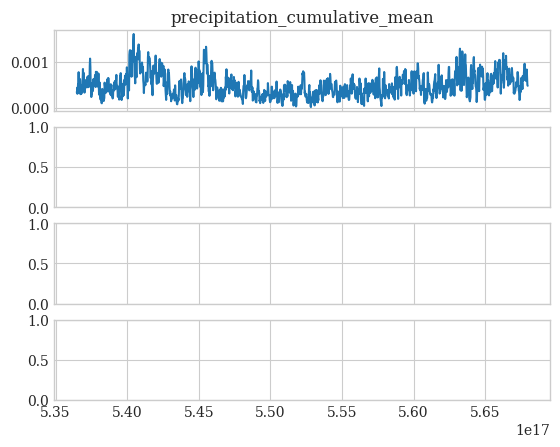

In [ ]:
import xarray as xr
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from tqdm import tqdm

def advanced_climate_diagnostics_2018(ds, target_year=2018):
    print(f"🚀 DÉMARRAGE DU DIAGNOSTIC COMPLET POUR {target_year} (DONNÉES INSTANTANÉES)")

    # ==========================================================================
    # 1. PRÉPARATION DES DONNÉES (DÉSACCUMULATION)
    # ==========================================================================
    print("--- 1. Préparation : Désaccumulation de la pluie ---")
    base_time = ds.time.values[0]
    valid_times = base_time + ds.prediction_timedelta.values
    valid_dates_pd = pd.to_datetime(valid_times)
    mask_year = (valid_dates_pd.year == target_year)

    if np.sum(mask_year) == 0:
        print(f"❌ Pas de données pour {target_year}")
        return

    # Sous-ensemble spatial et temporel
    ds_subset = ds.isel(prediction_timedelta=mask_year).isel(time=0)
    if 'surface' in ds_subset.dims: ds_subset = ds_subset.squeeze('surface')

    # Calcul pluie instantanée
    precip_name = 'precipitation_cumulative_mean' # Vérifiez si c'est le bon nom
    da_precip_inst = ds_subset[precip_name].diff(dim='prediction_timedelta')
    da_precip_inst = da_precip_inst.where(da_precip_inst >= 0, 0)

    # Création d'une série temporelle moyenne (Moyenne spatiale sur la grille)
    # Nécessaire pour Rolling Mean, Autocorrelation, Decomposition
    ts_precip = da_precip_inst.mean(dim=['latitude', 'longitude']).to_pandas()

    # Création d'un vecteur aplati pour les stats (Hist, KDE, Normality)
    flat_precip = da_precip_inst.values.flatten()

    # Extraction Evaporation pour P/E Ratio (alignement temporel)
    da_evap = ds_subset['evaporation'].isel(prediction_timedelta=slice(1, None))
    flat_evap = da_evap.values.flatten()

    # ==========================================================================
    # 2. ANALYSE DE DISTRIBUTION (Hist, KDE, Normality, Skewness)
    # ==========================================================================
    print("\n📊 --- Analyse de Distribution (Hist, KDE, Normality) ---")

    plt.figure(figsize=(10, 6))
    # Histogramme + KDE
    # On filtre les 0 stricts pour mieux voir la distribution de la pluie quand elle tombe
    rainy_events = flat_precip[flat_precip > 1e-8]

    sns.histplot(rainy_events, kde=True, stat="density", color="royalblue", bins=50, log_scale=(False, True))
    plt.title(f"Distribution des Intensités de Pluie (Log Scale Y) - {target_year}")
    plt.xlabel("Precipitation Rate (mm/step)")
    plt.grid(True, alpha=0.3)
    plt.savefig("Analysis_Distribution_KDE.pdf", format='pdf', bbox_inches='tight')
    plt.close()

    # Tests Statistiques
    skew_val = stats.skew(flat_precip)
    kurt_val = stats.kurtosis(flat_precip)

    # Test de Normalité (Shapiro-Wilk) - Sur un échantillon car N est trop grand
    sample_for_test = np.random.choice(flat_precip, 2000)
    stat_shapiro, p_shapiro = stats.shapiro(sample_for_test)

    print(f"➤ Skewness: {skew_val:.4f} (Si > 0, queue vers la droite)")
    print(f"➤ Kurtosis: {kurt_val:.4f} (Si > 3, queues lourdes/extrêmes)")
    print(f"➤ Shapiro-Wilk Test: p-value={p_shapiro:.4e} (Si < 0.05, PAS normal)")

    # ==========================================================================
    # 3. ANALYSE TEMPORELLE (Rolling Means & Autocorrelation)
    # ==========================================================================
    print("\n⏳ --- Analyse Temporelle (Rolling Means, Autocorr) ---")

    # A. Rolling Means (Moyenne Glissante)
    plt.figure(figsize=(12, 6))
    # Fenêtre de 24 pas de temps (ex: 24h si données horaires)
    window_size = 24
    ts_precip.plot(label='Brut (Instantaneous)', alpha=0.3, color='gray')
    ts_precip.rolling(window=window_size).mean().plot(label=f'Rolling Mean ({window_size} steps)', color='red', linewidth=2)
    plt.legend()
    plt.title("Time Series & Rolling Mean (Spatially Averaged)")
    plt.ylabel("Average Rain Rate")
    plt.grid(True, alpha=0.3)
    plt.savefig("Analysis_Rolling_Means.pdf", format='pdf', bbox_inches='tight')
    plt.close()

    # B. Autocorrelation (ACF)
    plt.figure(figsize=(10, 5))
    sm.graphics.tsa.plot_acf(ts_precip, lags=72, alpha=0.05, title='Autocorrelation Function (ACF)')
    plt.xlabel("Lag (Time Steps)")
    plt.grid(True, alpha=0.3)
    plt.savefig("Analysis_Autocorrelation.pdf", format='pdf', bbox_inches='tight')
    plt.close()

    # C. Seasonal Decomposition
    # On essaie de décomposer (Trend + Season + Residual)
    # period=24 suppose un cycle diurne si données horaires
    try:
        decomposition = seasonal_decompose(ts_precip, model='additive', period=24, extrapolate_trend='freq')
        fig = decomposition.plot()
        fig.set_size_inches(12, 10)
        plt.savefig("Analysis_Seasonal_Decomposition.pdf", format='pdf', bbox_inches='tight')
        plt.close()
    except Exception as e:
        print(f"⚠️ Impossible de faire la décomposition saisonnière : {e}")

    # ==========================================================================
    # 4. ANALYSE SPATIALE (Spatial Analysis)
    # ==========================================================================
    print("\n🌍 --- Analyse Spatiale (Cartes Moyennes & Max) ---")

    # Moyenne Temporelle (Où pleut-il en moyenne ?)
    mean_spatial = da_precip_inst.mean(dim='prediction_timedelta')
    # Max Temporel (Où sont les extrêmes ?)
    max_spatial = da_precip_inst.max(dim='prediction_timedelta')

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Plot Mean
    mean_spatial.plot(ax=axes[0], cmap='YlGnBu', cbar_kwargs={'label': 'Mean Precip Rate'})
    axes[0].set_title("Spatial Mean Precipitation (2018)")
    axes[0].grid(True, alpha=0.5)

    # Plot Max
    max_spatial.plot(ax=axes[1], cmap='Reds', cbar_kwargs={'label': 'Max Precip Rate'})
    axes[1].set_title("Spatial Max Precipitation (Extreme Events)")
    axes[1].grid(True, alpha=0.5)

    plt.tight_layout()
    plt.savefig("Analysis_Spatial_Maps.pdf", format='pdf', bbox_inches='tight')
    plt.close()

    # ==========================================================================
    # 5. P/E RATIO INSIGHTS (Precipitation / Evaporation)
    # ==========================================================================
    print("\n💧 --- P/E Ratio Insights (Aridity Index) ---")

    # Attention aux divisions par zéro
    epsilon = 1e-6
    # On utilise les valeurs aplaties
    # Ratio > 1 : Régime humide (Runoff)
    # Ratio < 1 : Régime sec (Evaporation limitée)
    pe_ratio = flat_precip / (np.abs(flat_evap) + epsilon)

    # On filtre les valeurs extrêmes pour l'affichage (le ratio peut être infini)
    pe_ratio_filtered = pe_ratio[pe_ratio < 10]

    plt.figure(figsize=(8, 6))
    sns.histplot(pe_ratio_filtered, bins=50, kde=True, color='purple')
    plt.axvline(1, color='red', linestyle='--', label='P = E (Equilibrium)')
    plt.title("Distribution of P/E Ratio (Hydrological Regime)")
    plt.xlabel("P/E Ratio")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.savefig("Analysis_PE_Ratio.pdf", format='pdf', bbox_inches='tight')
    plt.close()

    # Insight statistique
    wet_days_perc = (pe_ratio > 1).mean() * 100
    print(f"➤ Pourcentage de points (temps/espace) où P > E (Régime Humide) : {wet_days_perc:.2f}%")

    print("✅ DIAGNOSTIC TERMINÉ. Tous les PDF sont générés.")

# --- EXECUTION ---
advanced_climate_diagnostics_2018(selected_data, target_year=2018)

In [ ]:
import xarray as xr
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from tqdm.notebook import tqdm  # Optimized for notebooks

# --- PLOTTING STYLE CONFIGURATION ---
sns.set_theme(style="whitegrid", context="notebook")
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.bbox'] = 'tight'
plt.rcParams['font.family'] = 'serif'

print("✅ Libraries loaded and styling configured.")

✅ Libraries loaded and styling configured.


In [ ]:
def preprocess_climate_data(ds, target_year=2018):
    """
    Extracts 2018 data, calculates instantaneous precipitation (de-accumulation),
    and filters for specific variables/levels.
    Returns:
        df_flat (pd.DataFrame): Flattened data for statistical/scatter analysis.
        ds_spatial (xr.Dataset): Gridded data for spatial/temporal analysis.
    """
    print(f"⚙️ Processing data for Year: {target_year}...")

    # 1. Time Extraction using Prediction Timedelta
    base_time = ds.time.values[0]
    valid_times = base_time + ds.prediction_timedelta.values
    valid_dates = pd.to_datetime(valid_times)
    mask_year = (valid_dates.year == target_year)

    if np.sum(mask_year) == 0:
        raise ValueError(f"❌ No data found for year {target_year}")

    # Subset Data
    ds_sub = ds.isel(prediction_timedelta=mask_year).isel(time=0)
    if 'surface' in ds_sub.dims: ds_sub = ds_sub.squeeze('surface')

    # 2. De-accumulation (Calculate Instantaneous Rain)
    print("💧 Calculating Instantaneous Precipitation...")
    precip_key = 'precipitation_cumulative_mean' # Adjust if your var name differs

    # Diff between t and t-1
    da_precip = ds_sub[precip_key].diff(dim='prediction_timedelta')
    da_precip = da_precip.where(da_precip >= 0, 0) # Remove negative numerical errors

    # 3. Variable Extraction & Alignment
    # We slice [1:] for other vars to match the length of diff-ed precipitation
    data_dict = {'Precipitation_Rate': da_precip.values.flatten()}

    # Configuration: Your specific variables
    target_config = {
        'u_component_of_wind': [500, 700, 850],
        'v_component_of_wind': [500, 700, 850],
        'specific_cloud_ice_water_content': [500, 700, 850],
        'evaporation': None
    }

    print("📦 Extracting specific pressure levels...")
    for var, levels in tqdm(target_config.items()):
        if var not in ds_sub: continue

        # Align time (remove first step)
        da_var = ds_sub[var].isel(prediction_timedelta=slice(1, None))

        if levels: # If variable has levels
            for lvl in levels:
                try:
                    # Extract level and flatten
                    vals = da_var.sel(level=lvl, method='nearest').values.flatten()
                    # Clean Name: e.g., U_Wind_850hPa
                    clean_name = f"{var.replace('specific_', '').replace('_content', '')}_{lvl}hPa"
                    data_dict[clean_name] = vals
                except KeyError: pass
        else: # Surface variable
            data_dict[var] = da_var.values.flatten()

    # Create DataFrame
    df_flat = pd.DataFrame(data_dict)

    # Create Spatial Dataset (keep dims) for Maps
    # We attach the calculated precip back to a dataset
    ds_spatial = ds_sub.isel(prediction_timedelta=slice(1, None)).copy()
    ds_spatial['Precipitation_Rate'] = da_precip

    print(f"✅ Processing Complete. DF Shape: {df_flat.shape}")
    return df_flat, ds_spatial

# --- EXECUTE PROCESSING ---
# Replace 'selected_data' with your actual xarray dataset variable name
df_2018, ds_2018 = preprocess_climate_data(selected_data, target_year=2018)

⚙️ Processing data for Year: 2018...
💧 Calculating Instantaneous Precipitation...
📦 Extracting specific pressure levels...


  0%|          | 0/4 [00:00<?, ?it/s]

✅ Processing Complete. DF Shape: (420192, 11)


In [ ]:
def analyze_statistics(df):
    print("\n📊 --- STATISTICAL MOMENTS ANALYSIS ---")

    stats_df = pd.DataFrame({
        'Mean': df.mean(),
        'Std_Dev': df.std(),
        'Skewness': df.skew(),
        'Kurtosis': df.kurtosis()
    })

    # Sort by Kurtosis to find Heavy Tails (Extremes)
    display(stats_df.sort_values(by='Kurtosis', ascending=False))

    # Normality Test on Precipitation
    precip = df['Precipitation_Rate'].values
    # Sample 2000 points because Shapiro-Wilk is sensitive to large N
    sample = np.random.choice(precip, 2000)
    stat, p_value = stats.shapiro(sample)

    print(f"\n🧪 Shapiro-Wilk Normality Test (Precipitation):")
    print(f"   Statistic={stat:.4f}, p-value={p_value:.4e}")
    if p_value < 0.05:
        print("   Result: Data is NOT Normal (Significant Heavy Tails detected).")
    else:
        print("   Result: Data looks Normal.")

    stats_df.to_csv("Statistical_Moments_2018.csv")

analyze_statistics(df_2018)


📊 --- STATISTICAL MOMENTS ANALYSIS ---


,Mean,Std_Dev,Skewness,Kurtosis
Precipitation_Rate,4.881122e-04,1.535152e-03,6.724267,70.162567
cloud_ice_water_500hPa,8.399039e-07,3.076756e-06,3.639119,32.037006
cloud_ice_water_850hPa,1.718381e-08,6.147408e-07,0.907405,11.157619
cloud_ice_water_700hPa,-2.836918e-07,1.143777e-06,0.413991,6.538114
evaporation,-2.663281e-05,3.136933e-05,-1.487632,2.464685
u_component_of_wind_850hPa,-1.271911e+00,5.140617e+00,0.768238,1.936418
v_component_of_wind_500hPa,-2.175481e-02,4.593870e+00,0.193907,1.933279
u_component_of_wind_500hPa,1.711890e+00,9.185873e+00,1.189175,1.763310
v_component_of_wind_850hPa,2.998113e-01,4.512877e+00,0.271216,0.834241
v_component_of_wind_700hPa,-3.271601e-01,4.113299e+00,-0.102861,0.748097



🧪 Shapiro-Wilk Normality Test (Precipitation):
   Statistic=0.3112, p-value=1.5381e-65
   Result: Data is NOT Normal (Significant Heavy Tails detected).


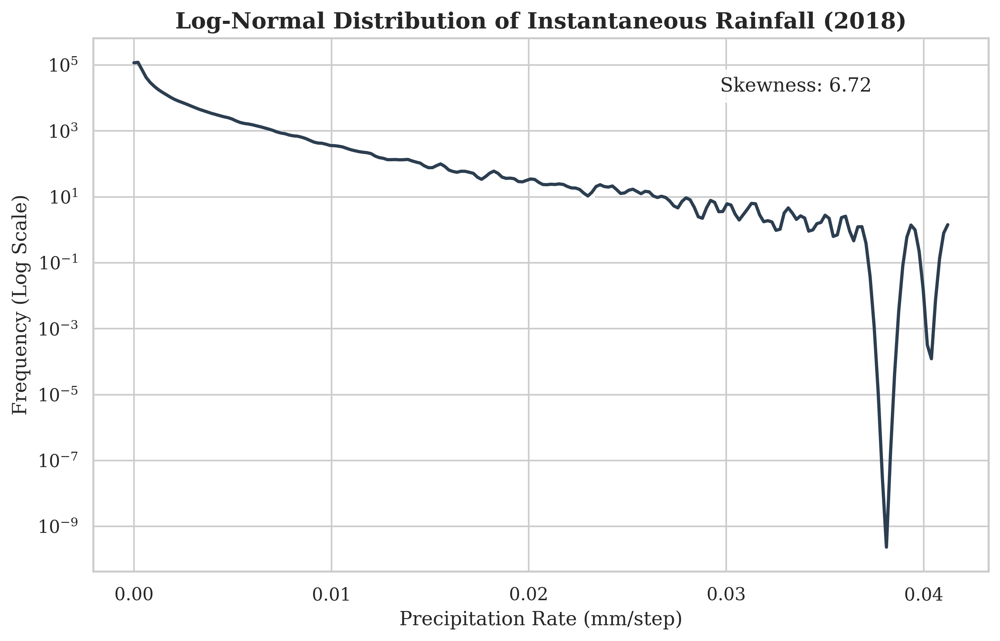

In [ ]:
def plot_distribution(df):
    plt.figure(figsize=(10, 6))

    # Filter zeros to see the tail clearly
    rain_data = df['Precipitation_Rate']
    rain_data = rain_data[rain_data > 0]

    sns.histplot(rain_data, kde=True, bins=60, color="#2c3e50",
                 log_scale=(False, True), line_kws={'linewidth': 2})

    plt.title("Log-Normal Distribution of Instantaneous Rainfall (2018)", fontsize=14, fontweight='bold')
    plt.xlabel("Precipitation Rate (mm/step)", fontsize=12)
    plt.ylabel("Frequency (Log Scale)", fontsize=12)

    # Add stats to plot
    plt.text(0.7, 0.9, f"Skewness: {df['Precipitation_Rate'].skew():.2f}",
             transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.8))

    plt.savefig("Distribution_Analysis.pdf")
    plt.show()

plot_distribution(df_2018)

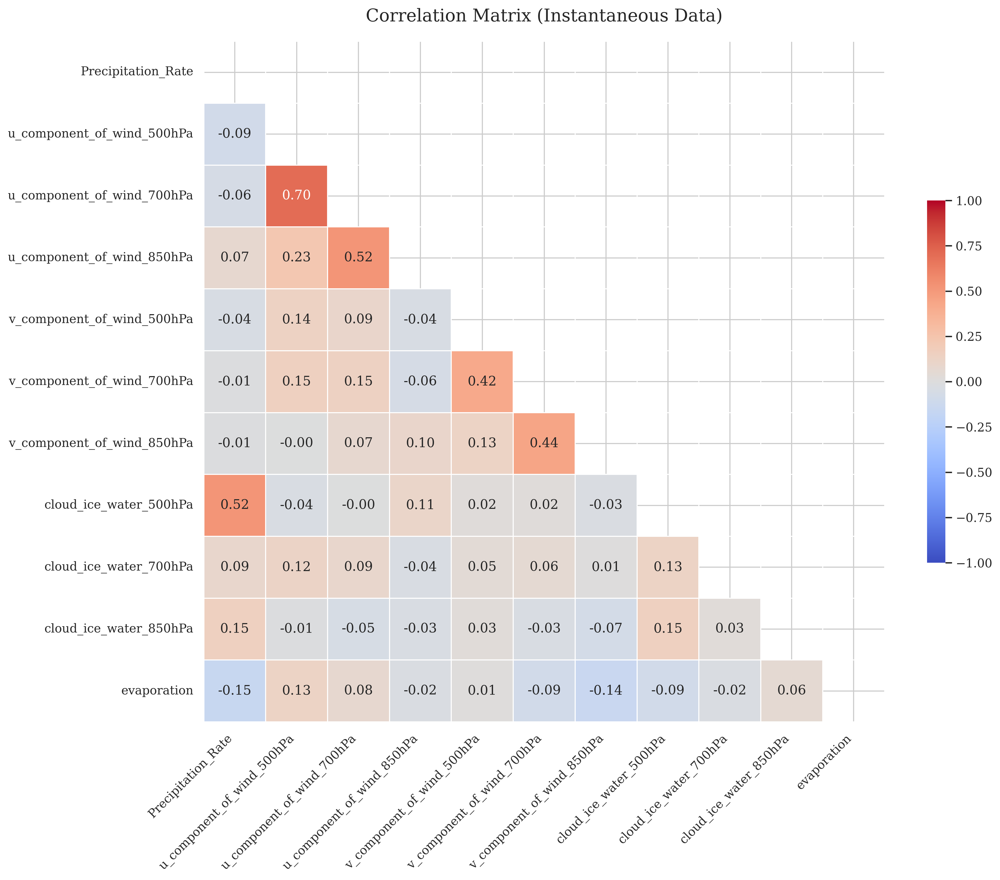

In [ ]:
def plot_correlation(df):
    # Subsample if data is too huge (>100k rows) for speed
    df_corr = df.sample(n=50000, random_state=42) if len(df) > 50000 else df
    corr = df_corr.corr()

    plt.figure(figsize=(14, 12))

    # Mask upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))

    sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap="coolwarm",
                vmax=1, vmin=-1, square=True, linewidths=.5,
                cbar_kws={"shrink": .5})

    plt.title("Correlation Matrix (Instantaneous Data)", fontsize=16, y=1.02)
    plt.xticks(rotation=45, ha='right')
    plt.savefig("Correlation_Matrix_2018.pdf")
    plt.show()

plot_correlation(df_2018)

🎨 Generating 10 Scatter Plots...


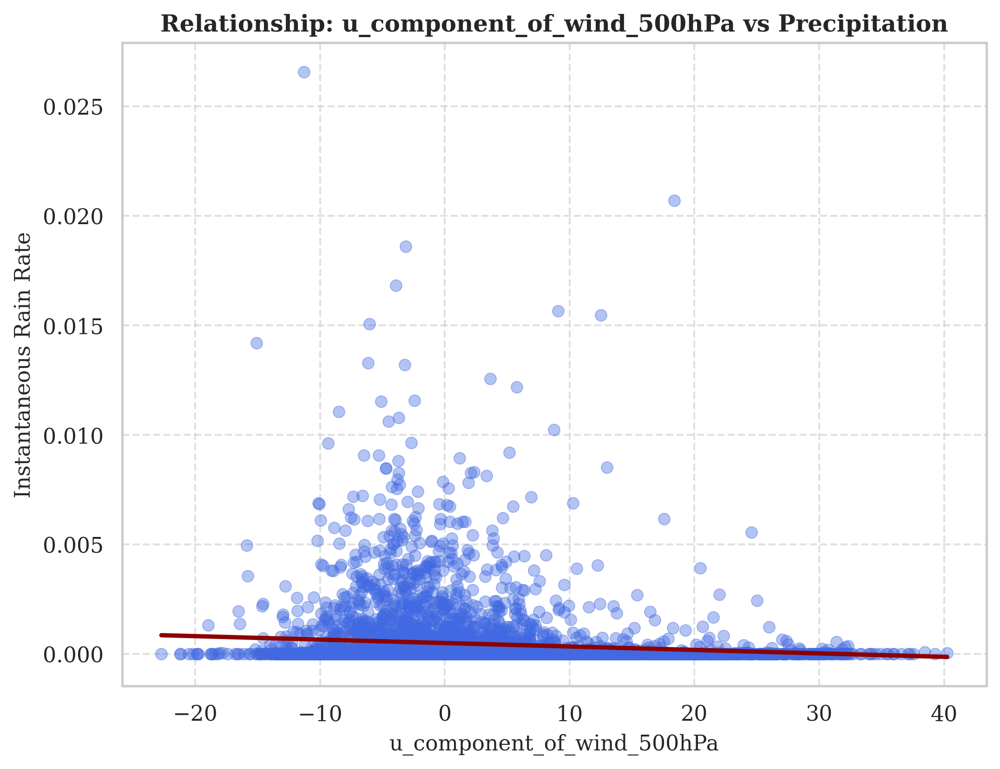

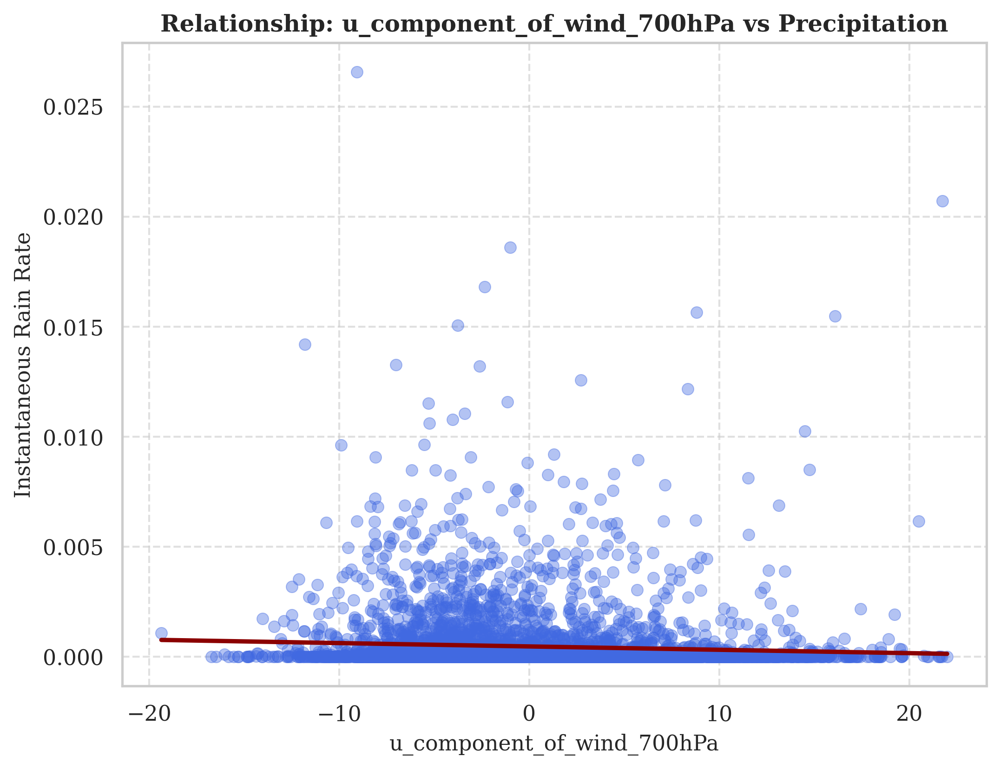

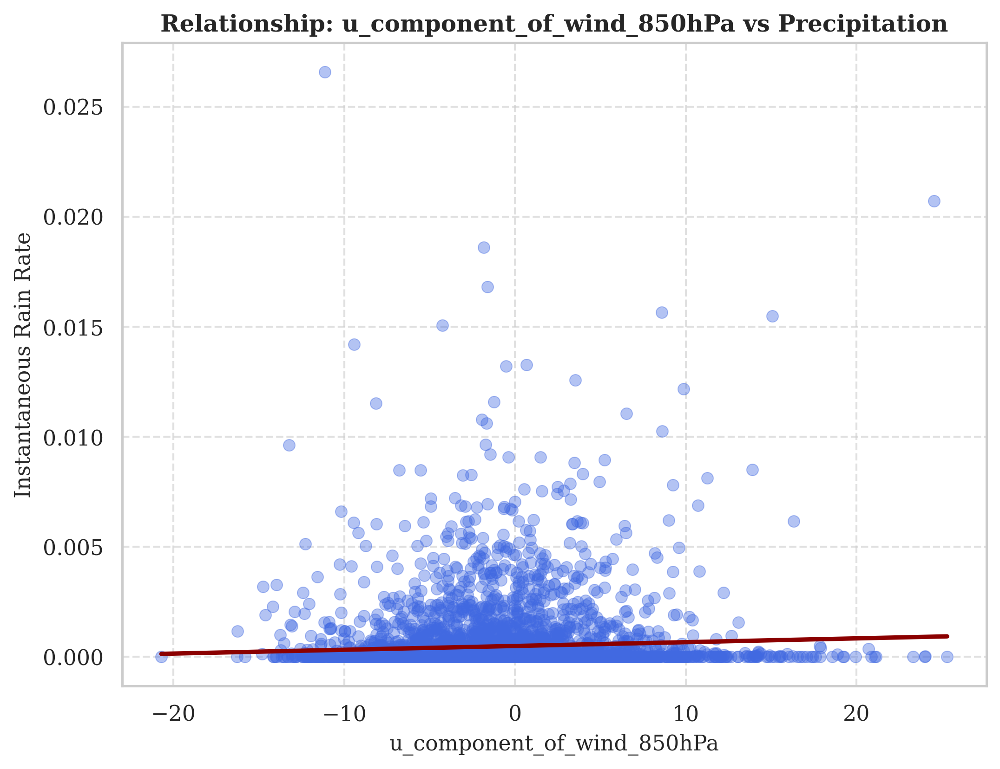

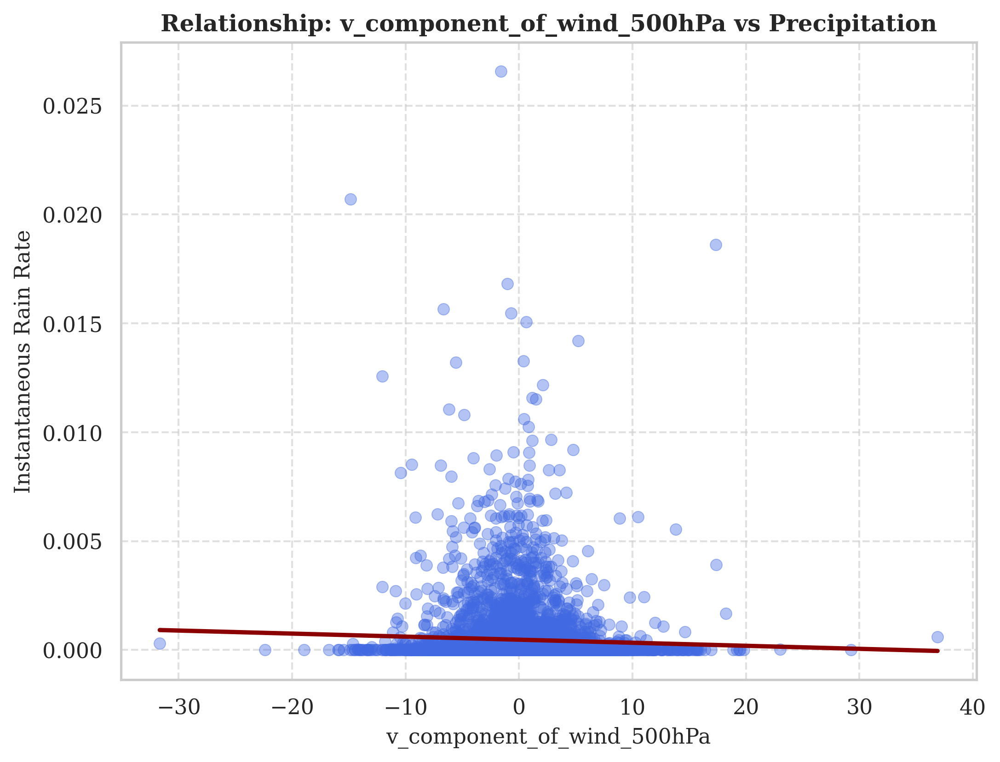

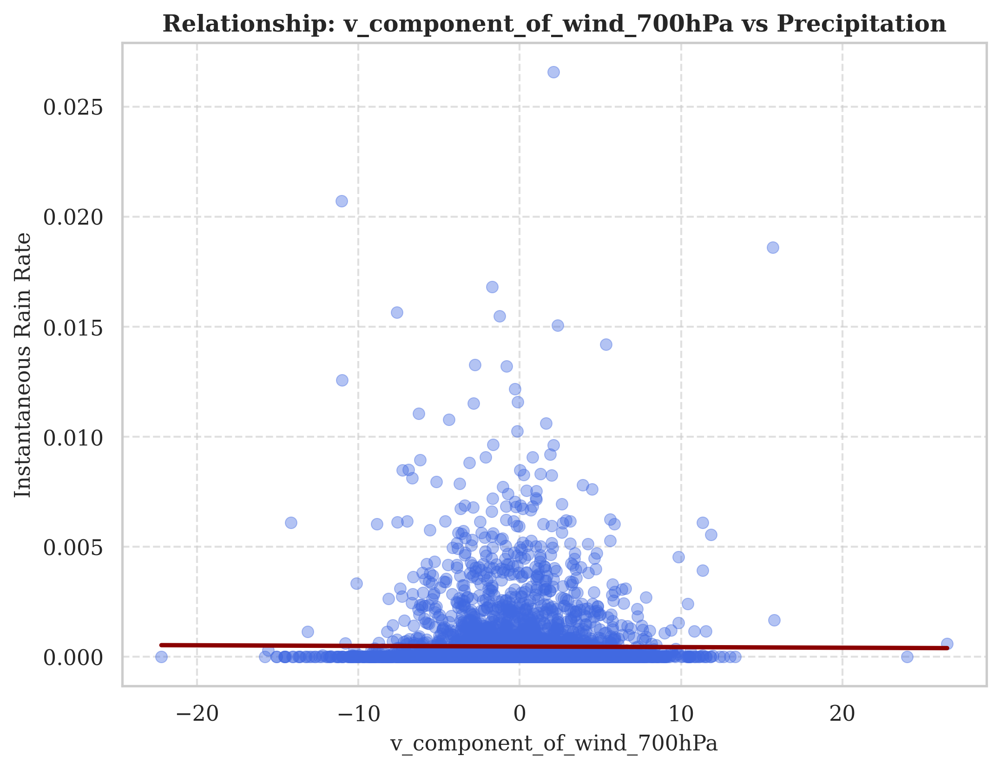

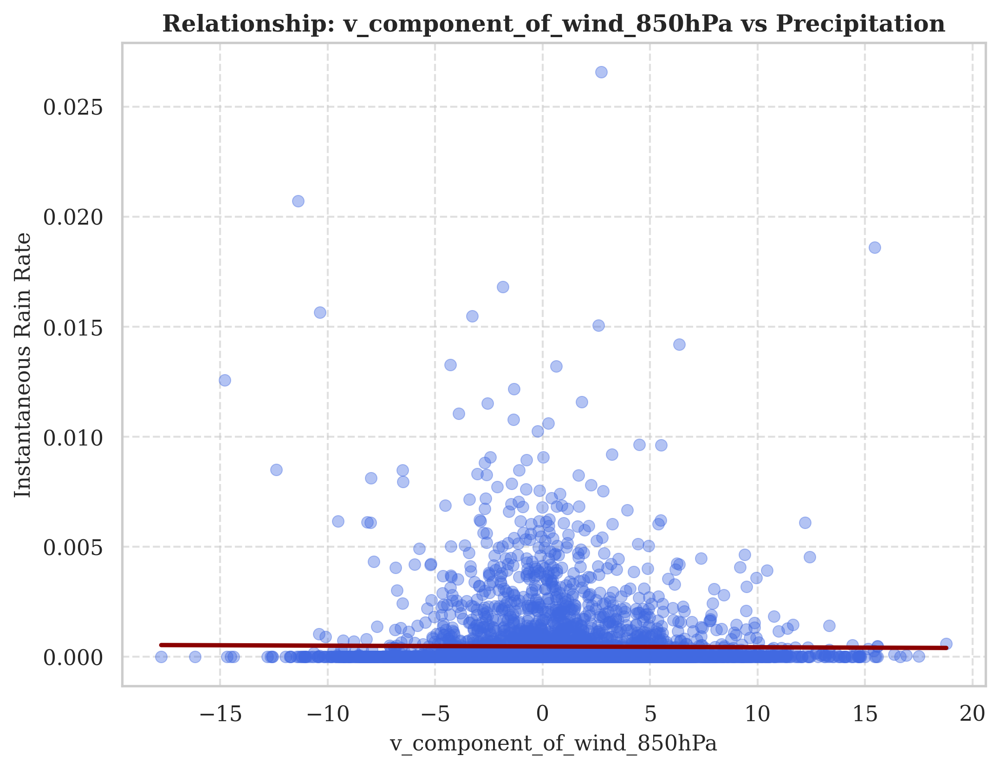

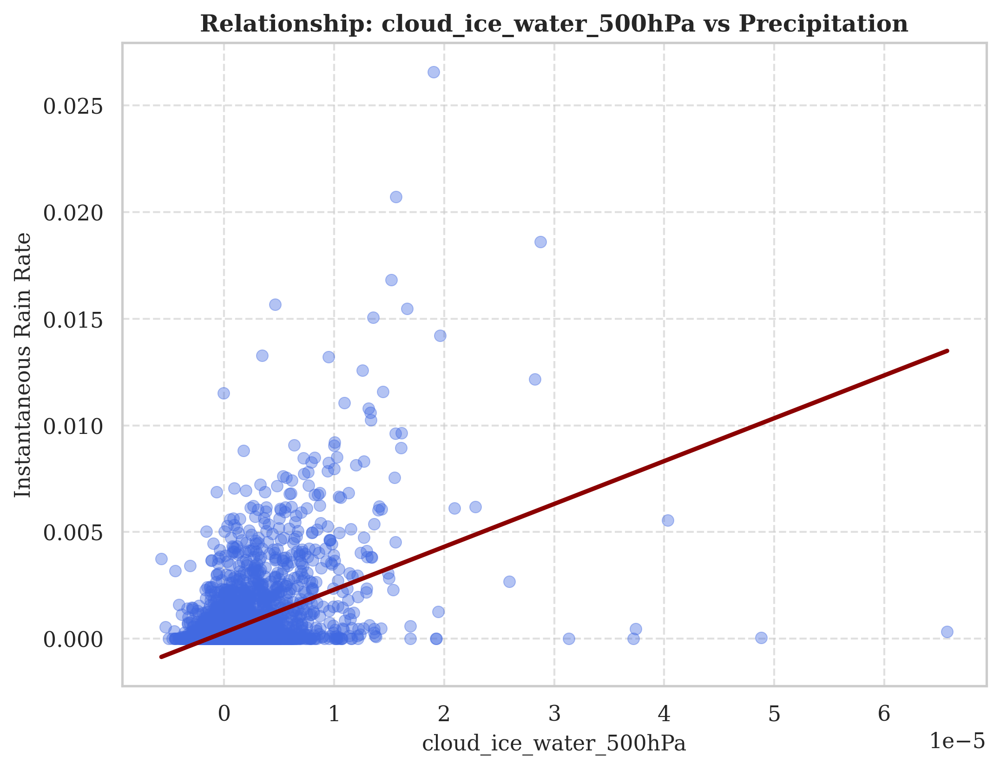

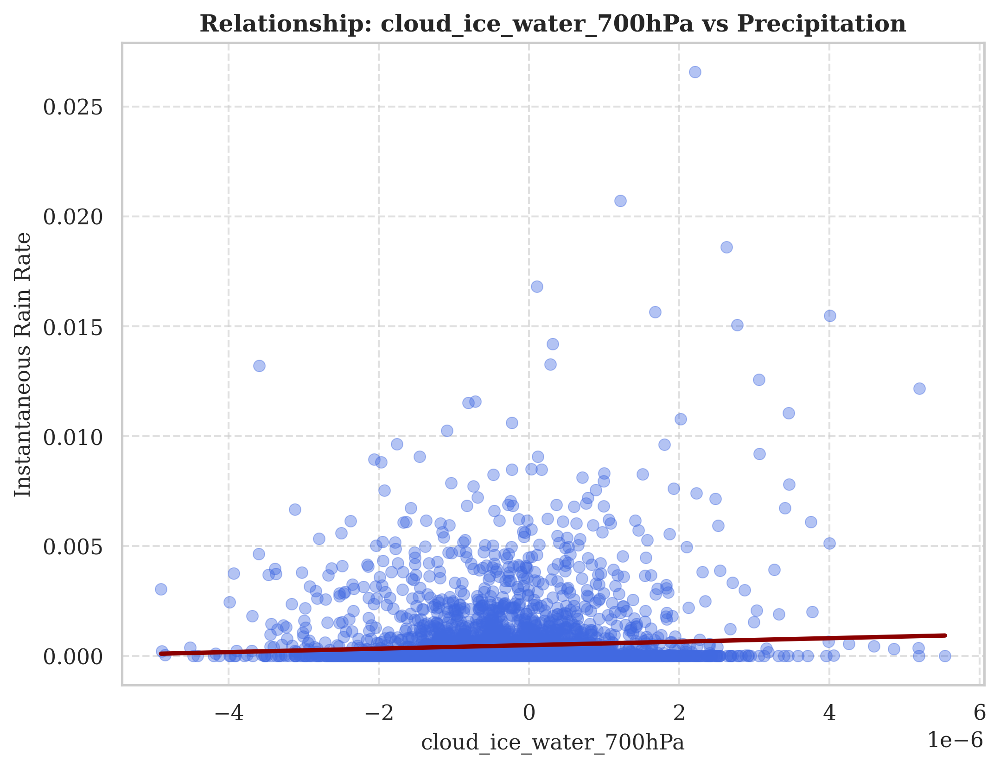

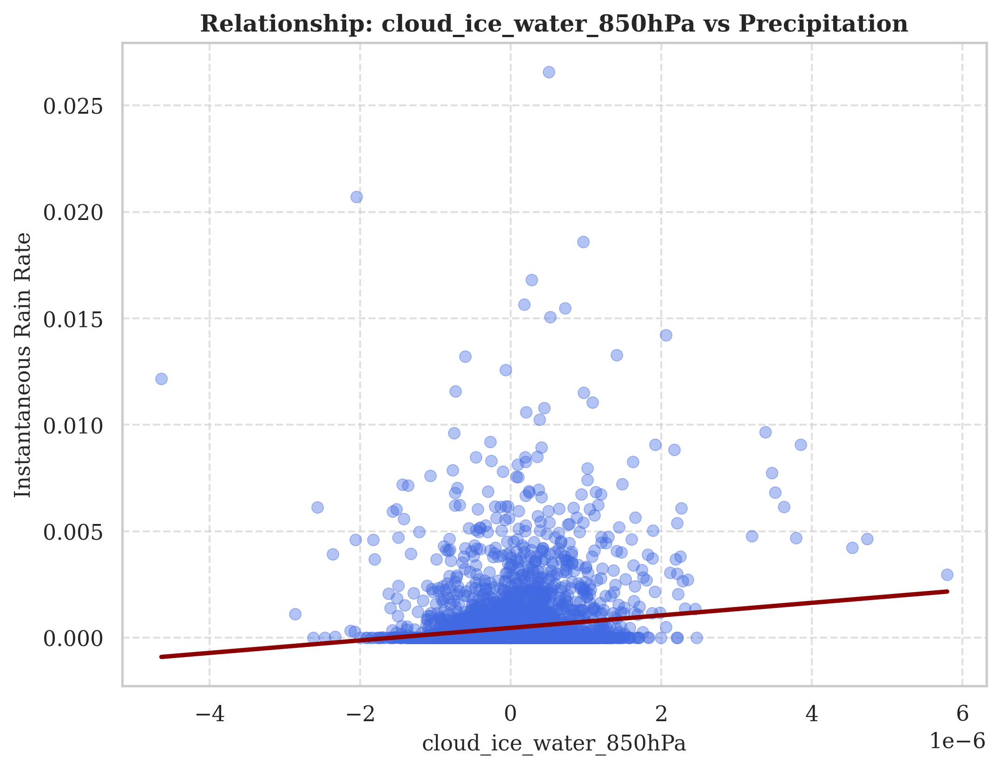

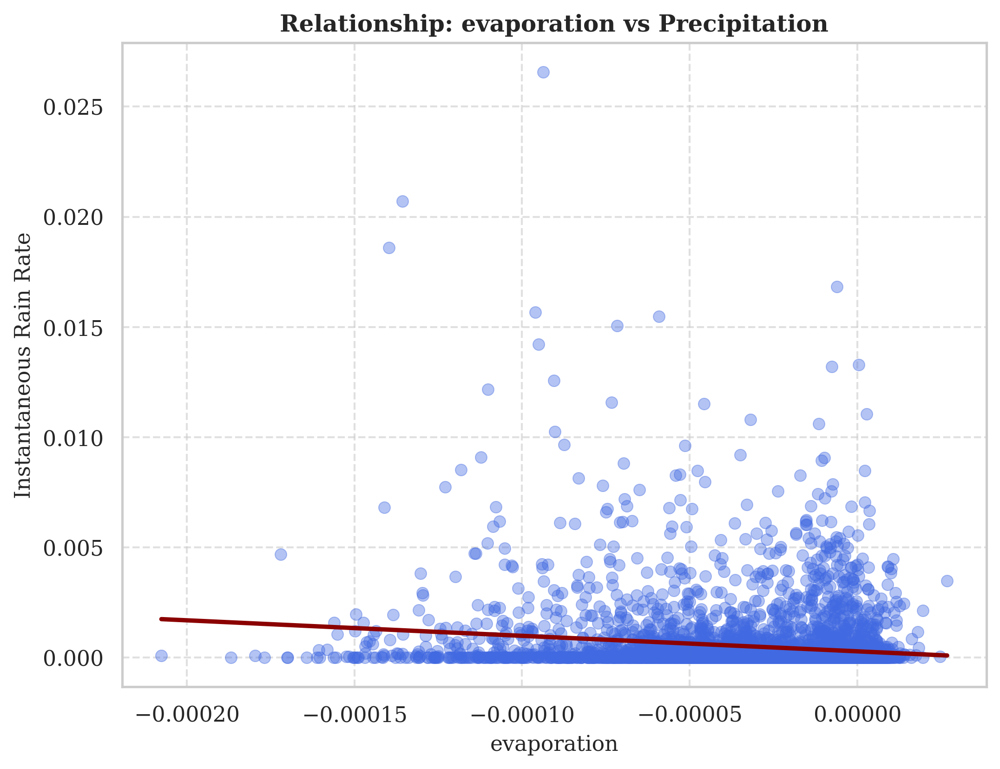

In [ ]:
def plot_individual_scatters(df, n_samples=5000):
    # Subsample for visualization clarity
    df_plot = df.sample(n=n_samples, random_state=42) if len(df) > n_samples else df
    target = 'Precipitation_Rate'
    predictors = [col for col in df.columns if col != target]

    print(f"🎨 Generating {len(predictors)} Scatter Plots...")

    for var in predictors:
        plt.figure(figsize=(8, 6))

        # Plot with transparency
        sns.scatterplot(data=df_plot, x=var, y=target,
                        alpha=0.4, color="royalblue", edgecolor=None)

        # Regression line (optional, visual aid)
        sns.regplot(data=df_plot, x=var, y=target, scatter=False, color="darkred", ci=None)

        plt.title(f"Relationship: {var} vs Precipitation", fontsize=12, fontweight='bold')
        plt.xlabel(var, fontsize=11)
        plt.ylabel("Instantaneous Rain Rate", fontsize=11)
        plt.grid(True, linestyle='--', alpha=0.6)

        # Save and Show
        filename = f"Scatter_{var}.pdf"
        plt.savefig(filename)
        plt.show() # Renders the plot in the notebook output

plot_individual_scatters(df_2018)

📊 Generating Distribution Details for 11 variables...


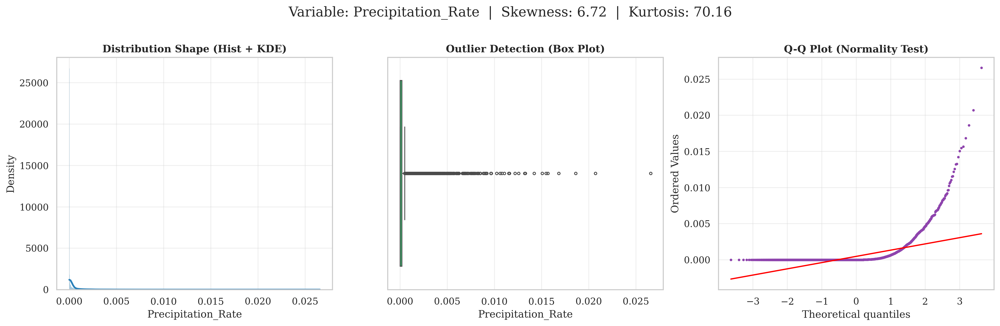

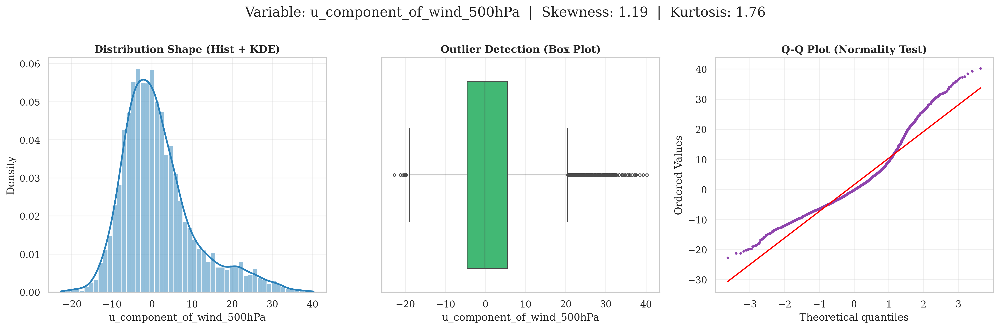

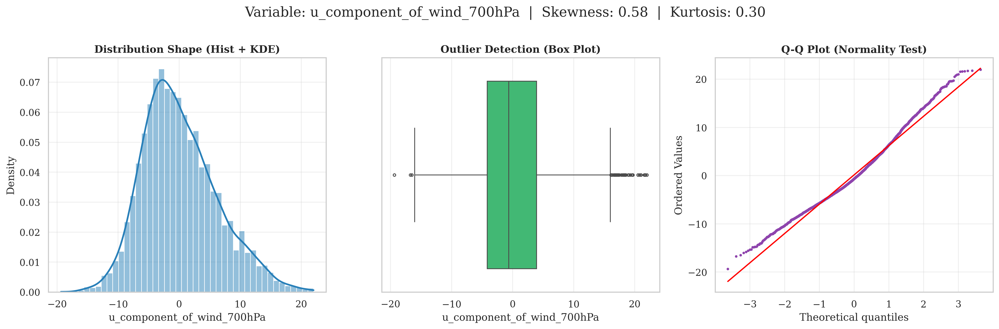

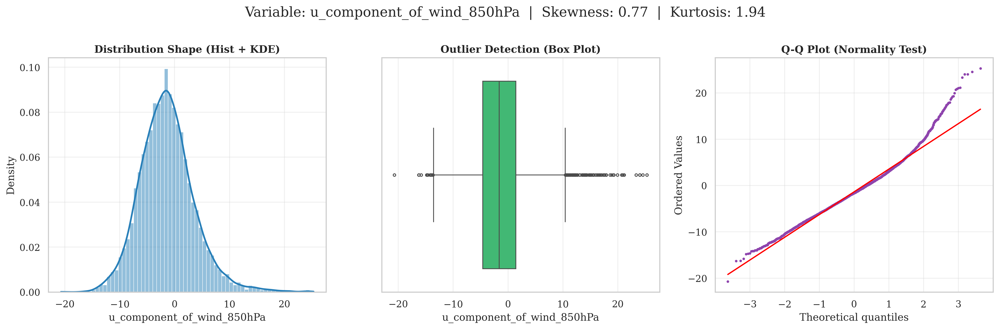

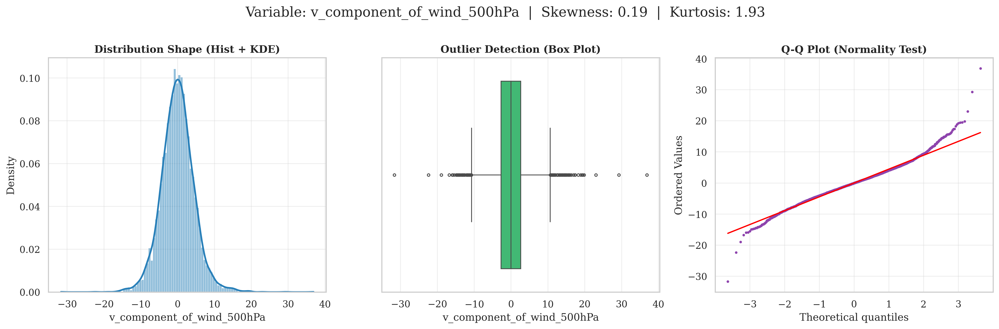

...

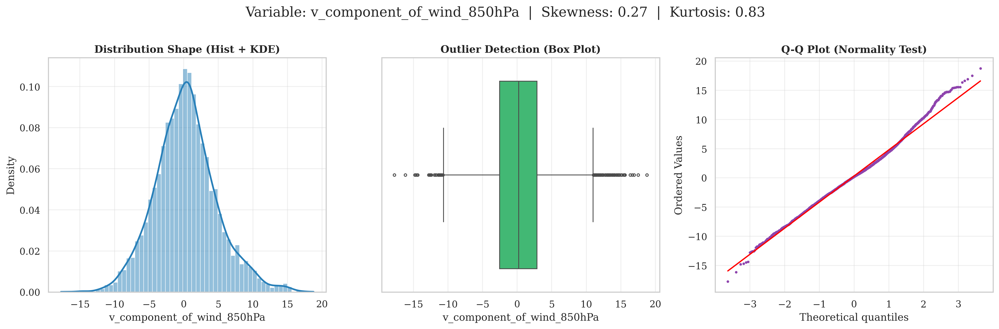

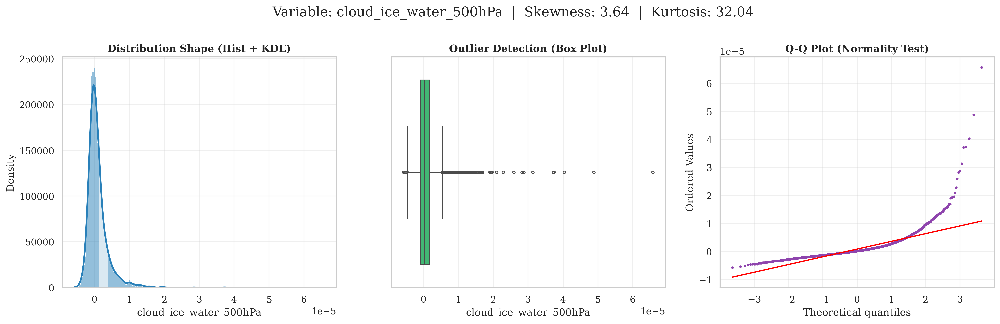

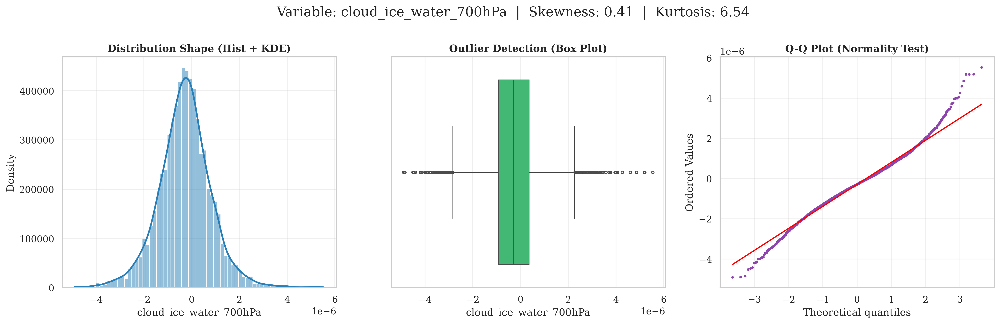

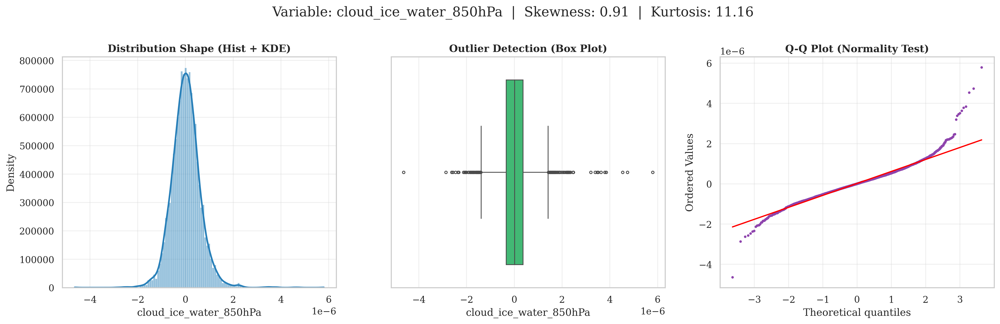

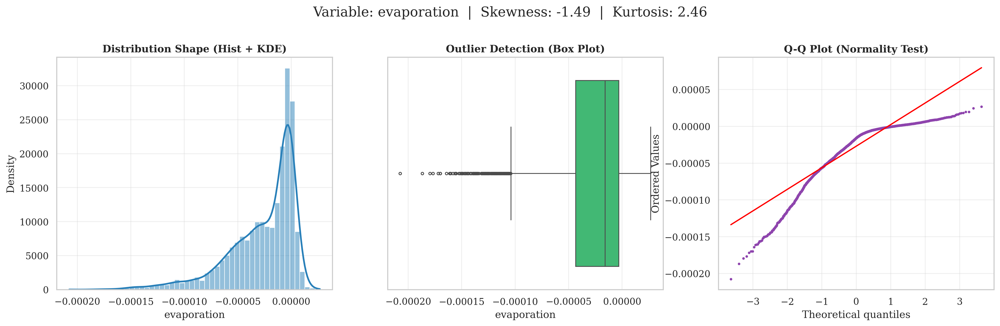

In [ ]:
def plot_variable_distributions(df, n_samples=5000):
    """
    Generates a detailed 3-panel distribution report for EVERY variable:
    1. Histogram/KDE (Shape)
    2. Box Plot (Outliers)
    3. Q-Q Plot (Normality check)
    """
    print(f"📊 Generating Distribution Details for {len(df.columns)} variables...")

    # Subsample for performance (rendering KDE/QQ on millions of points is slow)
    if len(df) > n_samples:
        df_plot = df.sample(n=n_samples, random_state=42)
    else:
        df_plot = df

    # Loop through every variable (Predictors + Target)
    for var in df.columns:
        # Create a figure with 3 subplots side-by-side
        fig, axes = plt.subplots(1, 3, figsize=(20, 5))

        # --- PANEL 1: Histogram & KDE ---
        sns.histplot(data=df_plot, x=var, kde=True, stat="density",
                     color="#2980b9", line_kws={'linewidth': 2}, ax=axes[0])
        axes[0].set_title(f"Distribution Shape (Hist + KDE)", fontweight='bold')
        axes[0].grid(True, alpha=0.3)

        # --- PANEL 2: Box Plot (Outliers) ---
        sns.boxplot(x=df_plot[var], color="#2ecc71", ax=axes[1], fliersize=3)
        axes[1].set_title(f"Outlier Detection (Box Plot)", fontweight='bold')
        axes[1].grid(True, axis='x', alpha=0.3)

        # --- PANEL 3: Q-Q Plot (Normality Check) ---
        # If data is Normal, points will lie on the red line.
        # If curve bends up/down at ends, it indicates 'Heavy Tails' (Extremes).
        stats.probplot(df_plot[var], dist="norm", plot=axes[2])
        axes[2].get_lines()[0].set_color('#8e44ad') # Change dots color
        axes[2].get_lines()[0].set_markersize(2)
        axes[2].get_lines()[1].set_color('red')     # Change line color
        axes[2].set_title(f"Q-Q Plot (Normality Test)", fontweight='bold')
        axes[2].grid(True, alpha=0.3)

        # --- Statistics Header ---
        # Calculate Skewness and Kurtosis
        skew = df[var].skew()
        kurt = df[var].kurt()

        # Add a main title with statistics
        plt.suptitle(f"Variable: {var}  |  Skewness: {skew:.2f}  |  Kurtosis: {kurt:.2f}",
                     fontsize=16, y=1.05)

        # --- Save & Show ---
        # Clean filename
        filename = f"Distribution_Detail_{var}.pdf"
        plt.savefig(filename, bbox_inches='tight')
        plt.show()

# --- EXECUTE ---
plot_variable_distributions(df_2018)

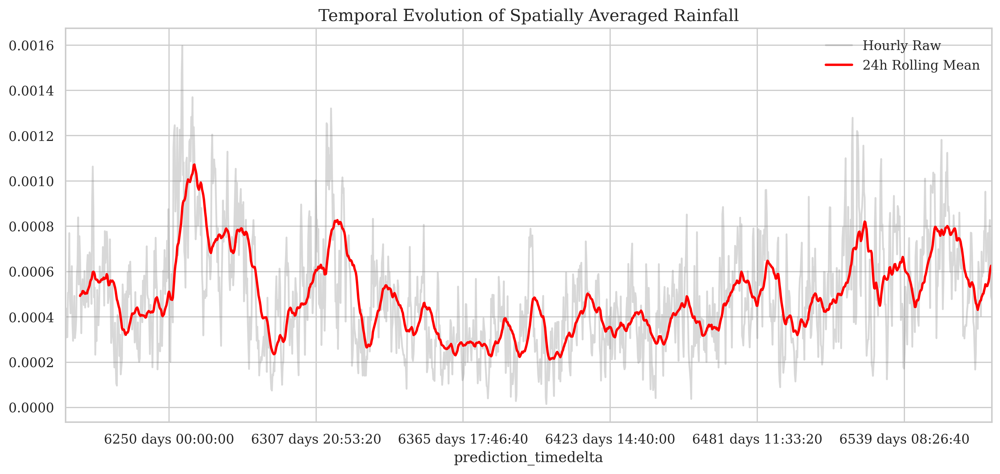

<Figure size 3600x1500 with 0 Axes>

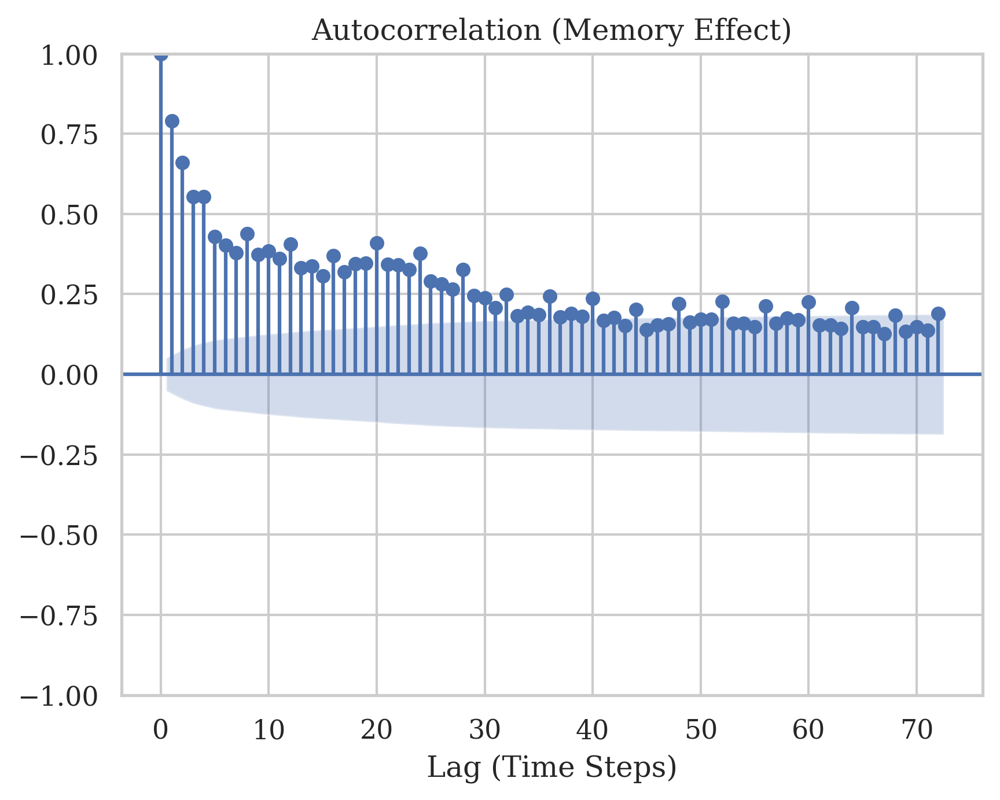

⚠️ Could not decompose: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''


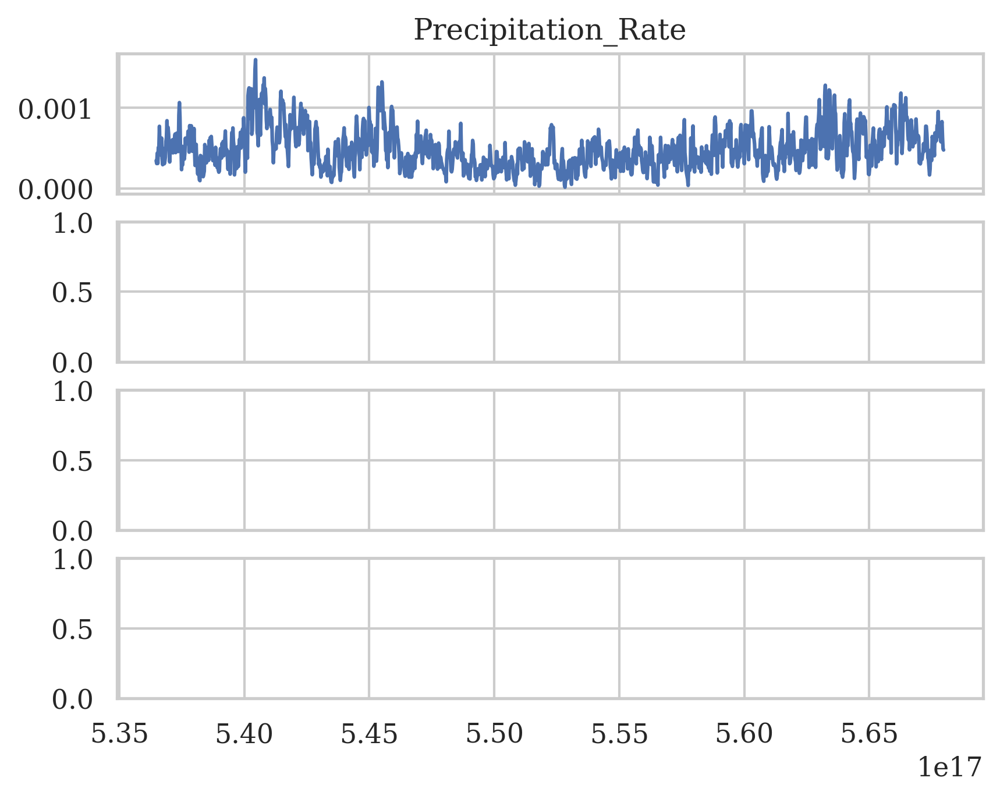

In [ ]:
def analyze_timeseries(ds_spatial):
    # Spatially average the data to get a single 1D time series
    ts_precip = ds_spatial['Precipitation_Rate'].mean(dim=['latitude', 'longitude']).to_pandas()

    # 1. Rolling Mean Plot
    plt.figure(figsize=(14, 6))
    ts_precip.plot(alpha=0.3, color='gray', label='Hourly Raw')
    ts_precip.rolling(window=24).mean().plot(color='red', linewidth=2, label='24h Rolling Mean')
    plt.title("Temporal Evolution of Spatially Averaged Rainfall", fontsize=14)
    plt.legend()
    plt.savefig("TimeSeries_Rolling.pdf")
    plt.show()

    # 2. Autocorrelation (ACF)
    plt.figure(figsize=(12, 5))
    sm.graphics.tsa.plot_acf(ts_precip, lags=72, alpha=0.05, title='Autocorrelation (Memory Effect)')
    plt.xlabel("Lag (Time Steps)")
    plt.savefig("Autocorrelation.pdf")
    plt.show()

    # 3. Seasonal Decomposition
    try:
        # Assuming 'period=24' for daily cycle if data is hourly
        res = seasonal_decompose(ts_precip, model='additive', period=24, extrapolate_trend='freq')
        fig = res.plot()
        fig.set_size_inches(12, 10)
        plt.suptitle("Seasonal Decomposition (Trend/Season/Residual)", y=1.02)
        plt.savefig("Seasonal_Decomposition.pdf")
        plt.show()
    except Exception as e:
        print(f"⚠️ Could not decompose: {e}")

analyze_timeseries(ds_2018)

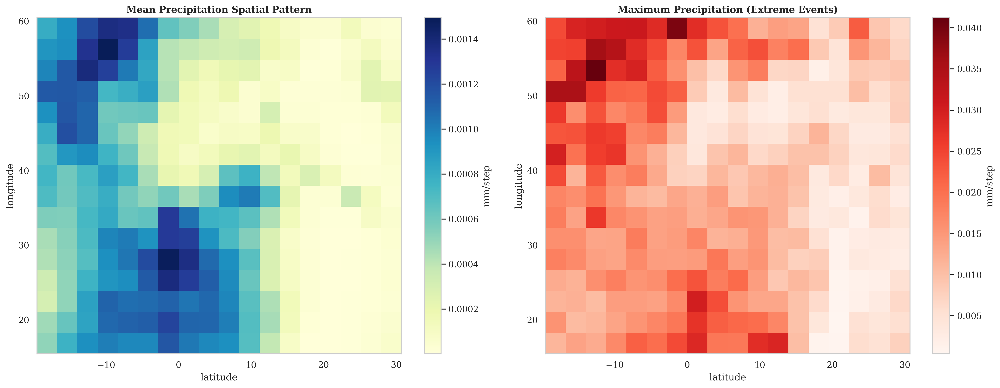

In [ ]:
def plot_spatial_analysis(ds_spatial):
    # 1. Mean Map
    mean_map = ds_spatial['Precipitation_Rate'].mean(dim='prediction_timedelta')
    # 2. Max Map (Extremes)
    max_map = ds_spatial['Precipitation_Rate'].max(dim='prediction_timedelta')

    fig, ax = plt.subplots(1, 2, figsize=(18, 7), subplot_kw={'projection': None})

    # Mean
    mean_map.plot(ax=ax[0], cmap='YlGnBu', cbar_kwargs={'label': 'mm/step'})
    ax[0].set_title("Mean Precipitation Spatial Pattern", fontweight='bold')
    ax[0].grid(alpha=0.3)

    # Max
    max_map.plot(ax=ax[1], cmap='Reds', cbar_kwargs={'label': 'mm/step'})
    ax[1].set_title("Maximum Precipitation (Extreme Events)", fontweight='bold')
    ax[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.savefig("Spatial_Analysis.pdf")
    plt.show()

plot_spatial_analysis(ds_2018)

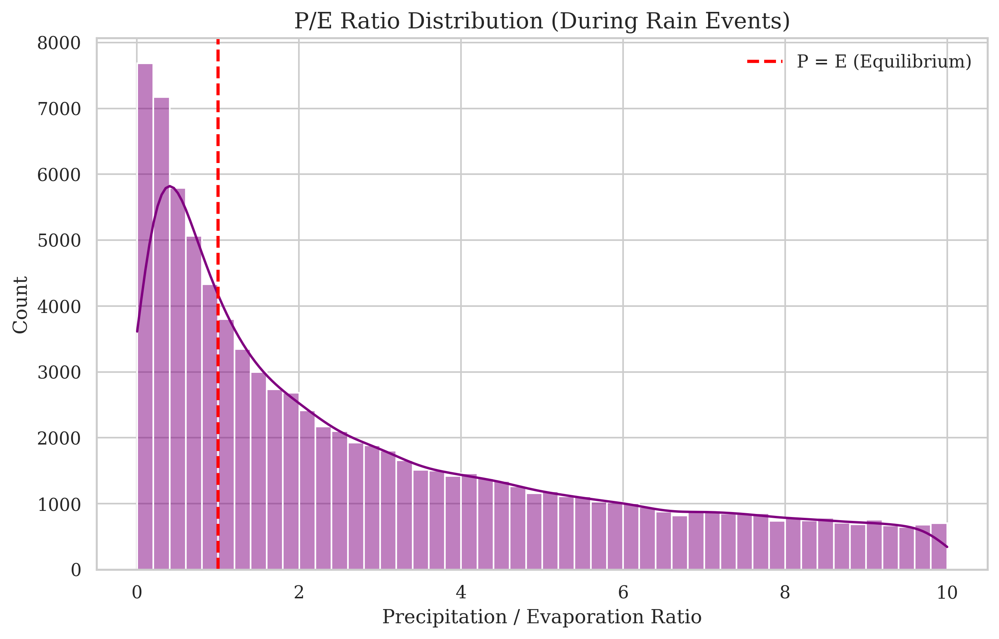

Percentage of events where Precip > Evap (Runoff generation): 36.79%


In [ ]:
def analyze_pe_ratio(df):
    epsilon = 1e-6
    # Ratio = Precip / Evap
    # Note: Evap is usually negative in some models (flux up). We take abs().
    pe_ratio = df['Precipitation_Rate'] / (df['evaporation'].abs() + epsilon)

    # Filter strictly positive precip events for meaningful log plot
    pe_wet = pe_ratio[df['Precipitation_Rate'] > 0]
    # Filter outliers for visualization
    pe_wet = pe_wet[pe_wet < 10]

    plt.figure(figsize=(10, 6))
    sns.histplot(pe_wet, bins=50, kde=True, color="purple")

    plt.axvline(1, color='red', linestyle='--', linewidth=2, label='P = E (Equilibrium)')
    plt.title("P/E Ratio Distribution (During Rain Events)", fontsize=14)
    plt.xlabel("Precipitation / Evaporation Ratio")
    plt.legend()

    plt.savefig("PE_Ratio_Analysis.pdf")
    plt.show()

    print(f"Percentage of events where Precip > Evap (Runoff generation): {(pe_ratio > 1).mean()*100:.2f}%")

analyze_pe_ratio(df_2018)

In [ ]:
import xarray as xr
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

def analyze_scatter_skewness_individual_2018(ds, target_year=2018, n_samples=5000):
    """
    1. Extrait les données 2018.
    2. Filtre uniquement les variables et niveaux choisis.
    3. Calcule le Skewness.
    4. Génère et sauvegarde un Scatter Plot individuel pour chaque variable.
    """

    # ==========================================================================
    # 1. FILTRAGE TEMPOREL (Année 2018)
    # ==========================================================================
    print(f"--- 1. Extraction des données pour {target_year} ---")
    base_time = ds.time.values[0]
    valid_times = base_time + ds.prediction_timedelta.values
    valid_dates_pd = pd.to_datetime(valid_times)
    mask_year = (valid_dates_pd.year == target_year)

    if np.sum(mask_year) == 0:
        print(f"❌ Pas de données pour {target_year}")
        return

    ds_subset = ds.isel(prediction_timedelta=mask_year).isel(time=0)
    if 'surface' in ds_subset.dims:
        ds_subset = ds_subset.squeeze('surface')

    # ==========================================================================
    # 2. SÉLECTION STRICTE (Vos Variables & Niveaux)
    # ==========================================================================
    data_dict = {}

    # Configuration stricte selon votre demande
    target_config = {
        'u_component_of_wind':              [500, 700, 850],
        'v_component_of_wind':              [500, 700, 850],
        'specific_cloud_ice_water_content': [500, 700, 850],
        'evaporation':                      None, # Pas de niveau
        'precipitation_cumulative_mean':    None  # Target
    }

    print("--- 2. Extraction des variables spécifiques ---")
    for var_name, levels in tqdm(target_config.items()):
        if var_name not in ds_subset:
            print(f"⚠️ Variable manquante : {var_name}")
            continue

        da = ds_subset[var_name]

        # CAS A : Variables à niveaux (Vent, Glace)
        if levels is not None and 'level' in da.dims:
            for level_val in levels:
                try:
                    # Sélection du niveau exact
                    da_level = da.sel(level=level_val, method='nearest')

                    # Nommage explicite ex: u_component_of_wind_850hPa
                    col_name = f"{var_name}_{level_val}hPa"
                    data_dict[col_name] = da_level.values.flatten()
                except KeyError:
                    print(f"⚠️ Niveau {level_val} absent pour {var_name}")

        # CAS B : Surface (Evaporation, Precip)
        else:
            data_dict[var_name] = da.values.flatten()

    # Création du DataFrame
    df = pd.DataFrame(data_dict)

    # ==========================================================================
    # 3. ANALYSE DE SKEWNESS (Asymétrie)
    # ==========================================================================
    print("\n📊 --- RÉSULTATS DU SKEWNESS (ASYMÉTRIE) ---")
    # On calcule sur tout le dataset 2018 avant sous-échantillonnage pour la précision
    skewness_stats = df.skew().sort_values(ascending=False)
    print(skewness_stats)

    # Sauvegarde des stats dans un CSV
    skewness_stats.to_csv(f"Skewness_Analysis_{target_year}.csv")
    print(f"📝 Statistiques sauvegardées dans 'Skewness_Analysis_{target_year}.csv'")

    # ==========================================================================
    # 4. PLOTS INDIVIDUELS
    # ==========================================================================
    # Sous-échantillonnage pour alléger les graphiques
    if len(df) > n_samples:
        df_plot = df.sample(n=n_samples, random_state=42)
    else:
        df_plot = df

    target_col = 'precipitation_cumulative_mean'
    # Liste des variables X (toutes sauf la cible)
    x_vars = [c for c in df.columns if c != target_col]

    print(f"\n--- 3. Génération des {len(x_vars)} figures individuelles ---")

    for x_var in tqdm(x_vars):
        plt.figure(figsize=(10, 8)) # Taille confortable

        # Scatter Plot
        # alpha=0.4 pour voir la densité
        sns.scatterplot(data=df_plot, x=x_var, y=target_col,
                        alpha=0.4, edgecolor='w', linewidth=0.2, color='royalblue')

        # Ajout de la GRILLE (Grid)
        plt.grid(True, linestyle='--', alpha=0.7, color='gray')

        # Labels clairs
        plt.xlabel(f"{x_var}", fontsize=12, fontweight='bold')
        plt.ylabel("Précipitation Cumulative Mean", fontsize=12, fontweight='bold')

        # Ajouter le Skewness sur le graphique pour information
        skew_val = skewness_stats[x_var]
        plt.text(0.05, 0.95, f"Skewness: {skew_val:.2f}", transform=plt.gca().transAxes,
                 fontsize=12, bbox=dict(facecolor='white', alpha=0.8))

        # Sauvegarde Individuelle
        # Nettoyage du nom de fichier
        clean_name = x_var.replace("specific_", "").replace("_content", "")
        filename = f"Scatter_2018_{clean_name}.png"

        plt.savefig(filename, dpi=300, bbox_inches='tight')
        plt.close() # Ferme la figure pour libérer la mémoire

    print("✅ Terminé. Toutes les figures sont générées.")

# --- EXECUTION ---
analyze_scatter_skewness_individual_2018(selected_data, target_year=2018, n_samples=5000)

--- 1. Extraction des données pour 2018 ---
--- 2. Extraction des variables spécifiques ---


100%|██████████| 5/5 [00:56<00:00, 11.26s/it]



📊 --- RÉSULTATS DU SKEWNESS (ASYMÉTRIE) ---
specific_cloud_ice_water_content_500hPa    3.638152
u_component_of_wind_500hPa                 1.189127
specific_cloud_ice_water_content_850hPa    0.907356
u_component_of_wind_850hPa                 0.768242
u_component_of_wind_700hPa                 0.583809
specific_cloud_ice_water_content_700hPa    0.413736
precipitation_cumulative_mean              0.331610
v_component_of_wind_850hPa                 0.271366
v_component_of_wind_500hPa                 0.193707
v_component_of_wind_700hPa                -0.102674
evaporation                               -1.488060
dtype: float32
📝 Statistiques sauvegardées dans 'Skewness_Analysis_2018.csv'

--- 3. Génération des 10 figures individuelles ---


100%|██████████| 10/10 [00:08<00:00,  1.11it/s]

✅ Terminé. Toutes les figures sont générées.


--- 1. Extraction des données pour l'année 2018 ---
--- 2. Extraction des variables spécifiques ---


100%|██████████| 5/5 [00:54<00:00, 10.93s/it]


Sous-échantillonnage à 5.0%...
Calcul de la corrélation...
✅ Graphique sauvegardé sous : Correlation_Selected_Vars_2018.pdf


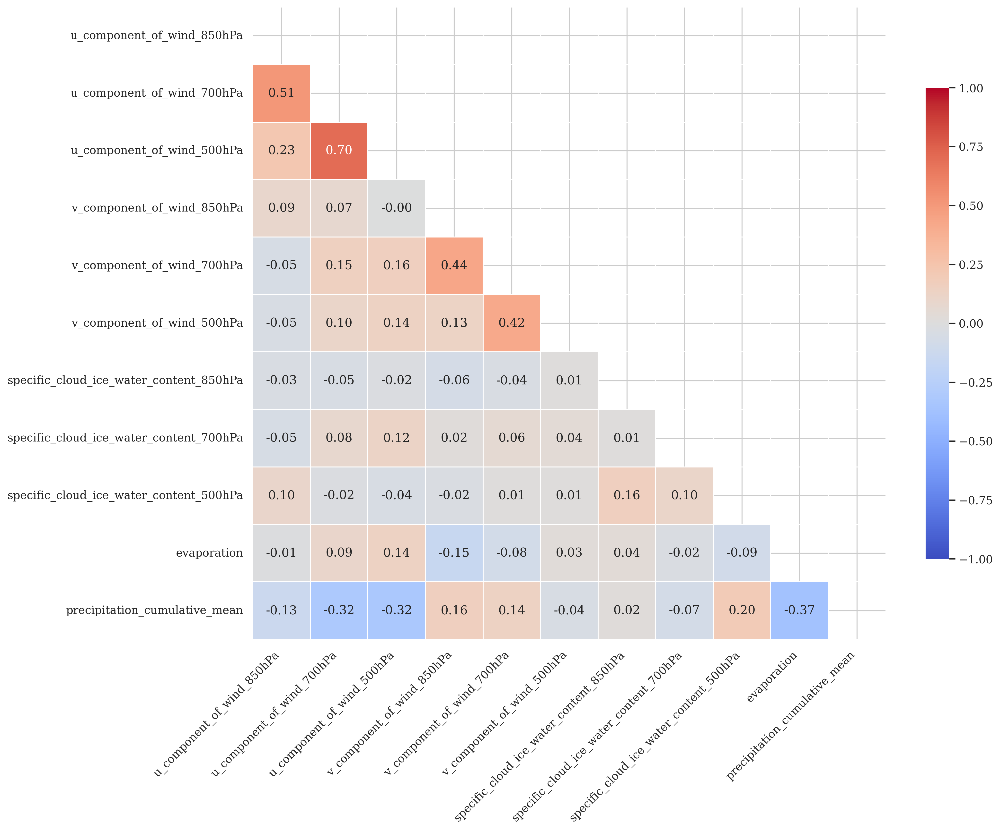


📊 Classement final avec la Précipitation :
precipitation_cumulative_mean              1.000000
specific_cloud_ice_water_content_500hPa    0.202385
v_component_of_wind_850hPa                 0.162993
v_component_of_wind_700hPa                 0.138746
specific_cloud_ice_water_content_850hPa    0.021469
v_component_of_wind_500hPa                -0.043459
specific_cloud_ice_water_content_700hPa   -0.072261
u_component_of_wind_850hPa                -0.132244
u_component_of_wind_700hPa                -0.318648
u_component_of_wind_500hPa                -0.321541
evaporation                               -0.367539
Name: precipitation_cumulative_mean, dtype: float64


In [ ]:
import xarray as xr
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

def plot_custom_selection_2018(ds, target_year=2018, subsample_frac=0.05):
    # ==========================================================================
    # 1. FILTRAGE TEMPOREL (Année 2018)
    # ==========================================================================
    print(f"--- 1. Extraction des données pour l'année {target_year} ---")

    base_time = ds.time.values[0]
    valid_times = base_time + ds.prediction_timedelta.values
    valid_dates_pd = pd.to_datetime(valid_times)
    mask_year = (valid_dates_pd.year == target_year)

    if np.sum(mask_year) == 0:
        print(f"❌ Aucune donnée trouvée pour {target_year}")
        return

    # On ne garde que les pas de temps de 2018
    ds_subset = ds.isel(prediction_timedelta=mask_year).isel(time=0)
    if 'surface' in ds_subset.dims:
        ds_subset = ds_subset.squeeze('surface')

    # ==========================================================================
    # 2. SÉLECTION STRICTE DES VARIABLES ET NIVEAUX
    # ==========================================================================
    data_dict = {}

    # Configuration de votre demande
    # Format : 'Nom_Dataset': [Niveaux]
    target_config = {
        'u_component_of_wind':              [850, 700, 500],
        'v_component_of_wind':              [850, 700, 500],
        'specific_cloud_ice_water_content': [850, 700, 500], # Note: nom complet xarray
        'evaporation':                      None,             # Pas de niveau
        'precipitation_cumulative_mean':    None              # Pas de niveau
    }

    print("--- 2. Extraction des variables spécifiques ---")

    for var_name, levels in tqdm(target_config.items()):
        if var_name not in ds_subset:
            print(f"⚠️ Attention: {var_name} non trouvé dans le dataset.")
            continue

        da = ds_subset[var_name]

        # CAS A : Variables avec niveaux de pression (Vent, Glace)
        if levels is not None and 'level' in da.dims:
            for level_val in levels:
                try:
                    # On utilise .sel pour chercher la valeur exacte (500, 700, etc.)
                    # method='nearest' permet d'éviter les erreurs si c'est 500.0 vs 500
                    da_level = da.sel(level=level_val, method='nearest')

                    # Nommage explicite
                    col_name = f"{var_name}_{level_val}hPa"
                    data_dict[col_name] = da_level.values.flatten()
                except KeyError:
                    print(f"⚠️ Niveau {level_val} non trouvé pour {var_name}")

        # CAS B : Variables de surface (Evaporation, Precip)
        else:
            # On garde le nom simple
            col_name = var_name
            data_dict[col_name] = da.values.flatten()

    # ==========================================================================
    # 3. DATAFRAME & SOUS-ÉCHANTILLONNAGE
    # ==========================================================================
    df = pd.DataFrame(data_dict)

    if subsample_frac < 1.0:
        print(f"Sous-échantillonnage à {subsample_frac*100}%...")
        df = df.sample(frac=subsample_frac, random_state=42)

    # ==========================================================================
    # 4. MATRICE DE CORRÉLATION TRIANGULAIRE
    # ==========================================================================
    print("Calcul de la corrélation...")
    corr_matrix = df.corr()

    plt.figure(figsize=(14, 12))

    # Création du masque pour cacher le haut du triangle
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    sns.heatmap(corr_matrix,
                mask=mask,
                annot=True,
                cmap='coolwarm',
                fmt=".2f",
                linewidths=0.5,
                vmin=-1, vmax=1,
                square=True,
                cbar_kws={"shrink": 0.7})

    # Rotation des labels pour lisibilité
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)

    # Pas de titre, comme demandé

    output_filename = f"Correlation_Selected_Vars_{target_year}.pdf"
    plt.savefig(output_filename, format='pdf', bbox_inches='tight')
    print(f"✅ Graphique sauvegardé sous : {output_filename}")
    plt.show()

    # Affichage console des liens avec la pluie
    if 'precipitation_cumulative_mean' in corr_matrix.columns:
        print("\n📊 Classement final avec la Précipitation :")
        print(corr_matrix['precipitation_cumulative_mean'].sort_values(ascending=False))

# --- EXECUTION ---
plot_custom_selection_2018(selected_data, target_year=2018, subsample_frac=0.05)

# Correlation and Relationship Analysis